<a href="https://colab.research.google.com/github/bwsi-hadr/2019-student-final-exercise/blob/master/Planning_Maps_Final_exercise_grid.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# need to specify location of some certificates for rasterio
!export CURL_CA_BUNDLE=/etc/ssl/certs/ca-certificates.crt
!sudo mkdir -p /etc/pki/tls/certs
!sudo cp /etc/ssl/certs/ca-certificates.crt /etc/pki/tls/certs/ca-bundle.crt
try:
  import rasterio
  import rasterio.plot
  import rasterio.merge 
  import rasterio.mask
except:
  !pip install rasterio
  import rasterio
  import rasterio.plot
  import rasterio.merge
  import rasterio.mask
  
try:
  import rasterstats as rs
except:
  !pip install rasterstats  
  import rasterstats as rs
  
try:
  import pyproj
except:
  !pip install pyproj
  import pyproj
  
import networkx as nx
try:
  import osmnx as ox
except:
  # osmnx depends on the system package libspatialindex
  !apt install libspatialindex-dev
  !pip install osmnx
  import osmnx as ox

try: 
  import geopandas as gpd
except: 
  !pip install geopandas 
  import geopandas as gpd
  
try:
  import contextily as ctx 
except:
  # install dependencies for contextily
  !apt install libproj-dev proj-data proj-bin
  !apt install libgeos-dev
  !pip install cython
  !pip install cartopy
  # install contextily
  !pip install contextily==1.0rc1 --no-use-pep517 --no-cache-dir
  import contextily as ctx
  
import fiona
from shapely.geometry import Point, LineString, Polygon
  
import gdal
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pathlib
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/'My Drive'/BWSI-Remote-Sensing/'Final_exercise'

     |████████████████████████████████| 19.7MB 1.8MB/s 
     |████████████████████████████████| 81kB 5.9MB/s 
     |████████████████████████████████| 17.9MB 9.1MB/s 
  Created wheel for simplejson: filename=simplejson-3.16.0-cp36-cp36m-linux_x86_64.whl size=114023 sha256=e96e813af58a582cf20cab445b7851a3b5e3d9b208ae2d29b1b6a82ad285ce37
  Stored in directory: /root/.cache/pip/wheels/5d/1a/1e/0350bb3df3e74215cd91325344cc86c2c691f5306eb4d22c77
  Created wheel for munch: filename=munch-2.3.2-py2.py3-none-any.whl size=6613 sha256=f346a58c1bbb7a3a1c35d276741a2eea69cbf36d115bd72962dda41b40b97294
  Stored in directory: /root/.cache/pip/wheels/db/bf/bc/06a3e1bfe0ab27d2e720ceb3cff3159398d92644c0cec2c125
Successfully built simplejson munch
     |████████████████████████████████| 11.2MB 2.8MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-410
Use 'apt a

In [72]:
!ls game_grid_export
!ls game2

facilities	      flooding.prj	       game_grid_all_stats.dbf
facilities_stats.csv  flooding.shp	       game_grid_all_stats.prj
flooding.cpg	      flooding.shx	       game_grid_all_stats.shp
flooding.dbf	      game_grid_all_stats.cpg  game_grid_all_stats.shx
prep_turn_0  prep_turn_1


In [0]:
original_grid=gpd.read_file('game_grid_export/game_grid_all_stats.shp')
game_grid=gpd.read_file('game2/prep_turn_1/curr_grid.shp')
#game_grid

In [0]:
#original_grid=gpd.read_file('/content/original_grid.shp')
change=game_grid.copy()
change['Health']=original_grid['Health']-game_grid['Health']
change['Utility']=original_grid['Utility']-game_grid['Utility']
change['Transporta']=original_grid['Transporta']-game_grid['Transporta']

In [9]:
game_grid

,Health,Utility,Transporta,geometry
0,10,7,8,POLYGON ((-71.79092278136125 42.58943590354409...
1,10,7,8,POLYGON ((-71.77874932612048 42.58973201162303...
2,10,7,8,POLYGON ((-71.76657568741803 42.59002682737616...
3,10,7,3,POLYGON ((-71.75440186615322 42.59032035170287...
4,10,7,3,POLYGON ((-71.74222786322531 42.59061258370377...
5,10,7,3,POLYGON ((-71.73005367863436 42.59090352427819...
6,10,7,3,POLYGON ((-71.71787931507833 42.59119317252686...
7,10,7,3,POLYGON ((-71.70570477165785 42.59148152844978...
8,10,7,3,POLYGON ((-71.69353005017166 42.59176859294621...
9,10,7,3,POLYGON ((-71.68135515061971 42.59205436511684...


In [10]:
game_grid.loc[game_grid['Health']<7]

,Health,Utility,Transporta,geometry


In [0]:
flooding=gpd.read_file('game_grid_export/flooding.shp')

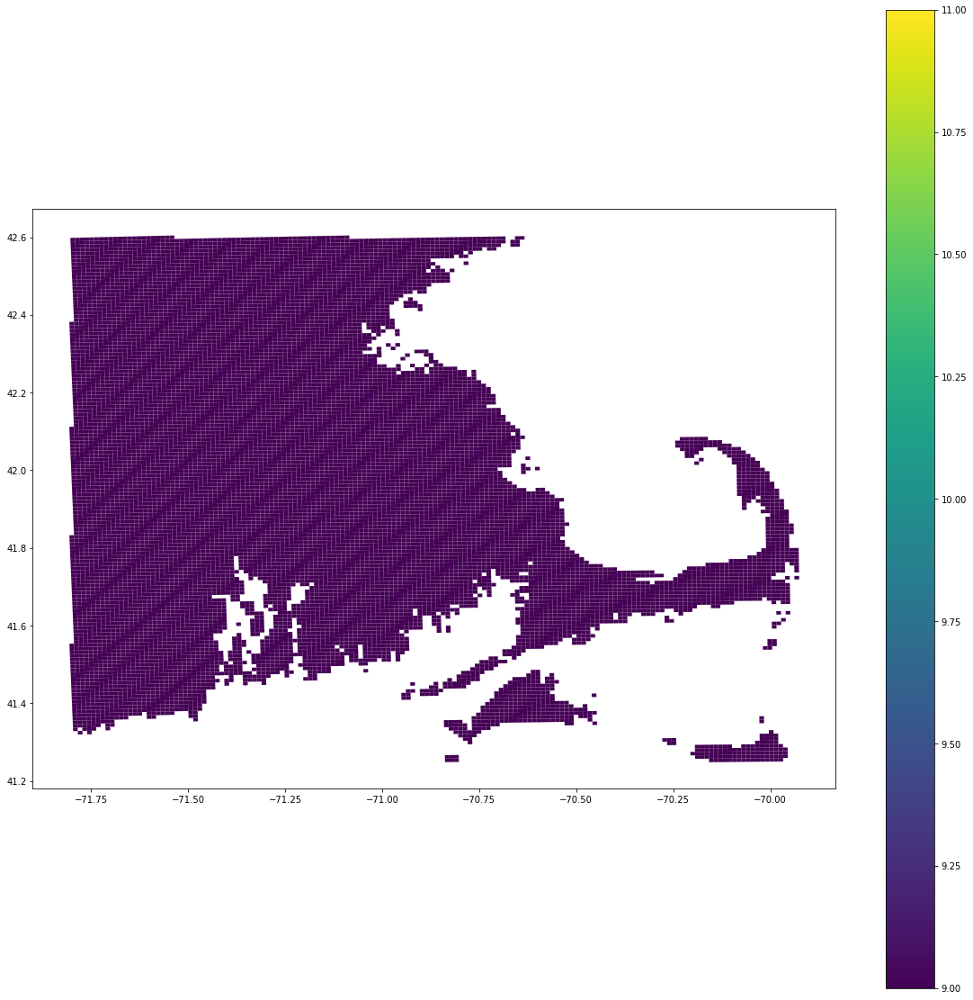

In [12]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Health', legend=True)

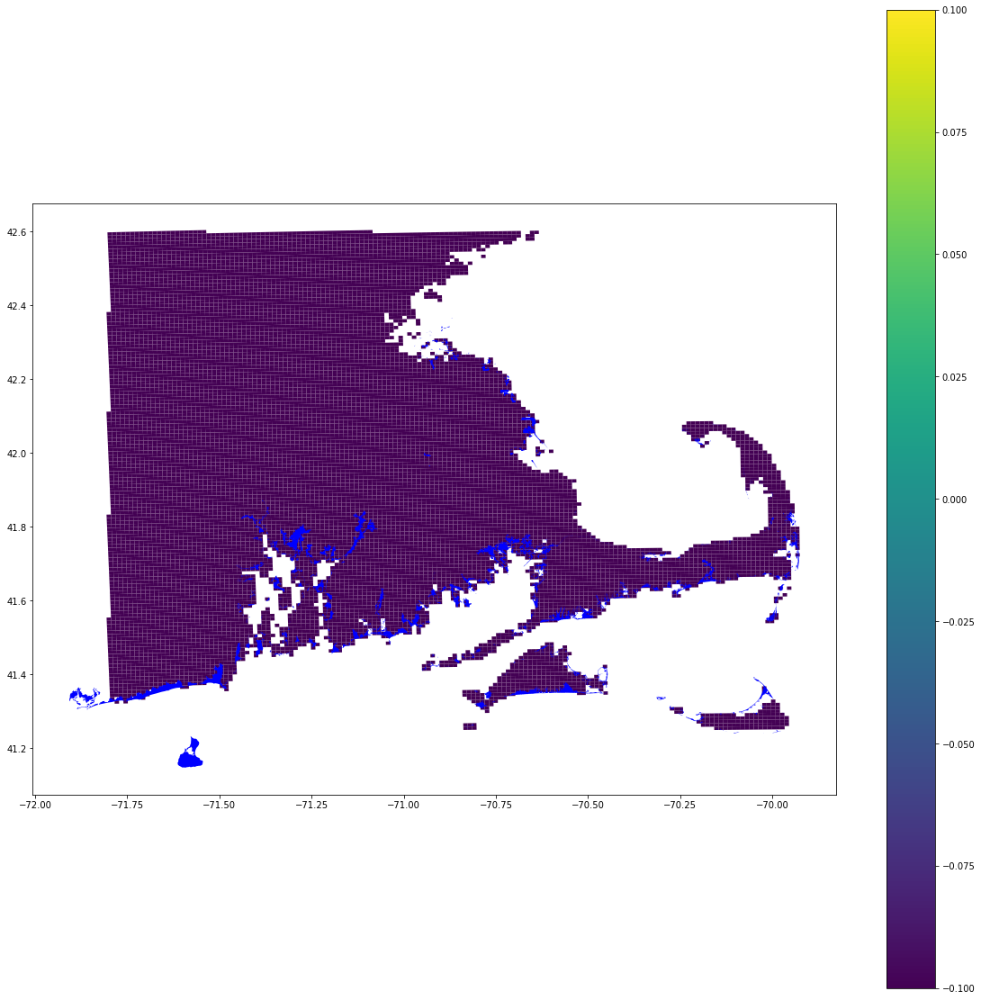

In [13]:
danger_grid=game_grid.copy()
danger_grid['danger']=0
danger_grid.loc[danger_grid['Health']>=9]['danger']=0
danger_grid.loc[danger_grid['Health']<9]['danger']=.0025
danger_grid.loc[danger_grid['Health']<7]['danger']=.005
danger_grid['danger']=original_grid['population']*danger_grid['danger']
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
danger_grid.plot(ax=ax, column='danger', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

In [0]:
#danger_grid

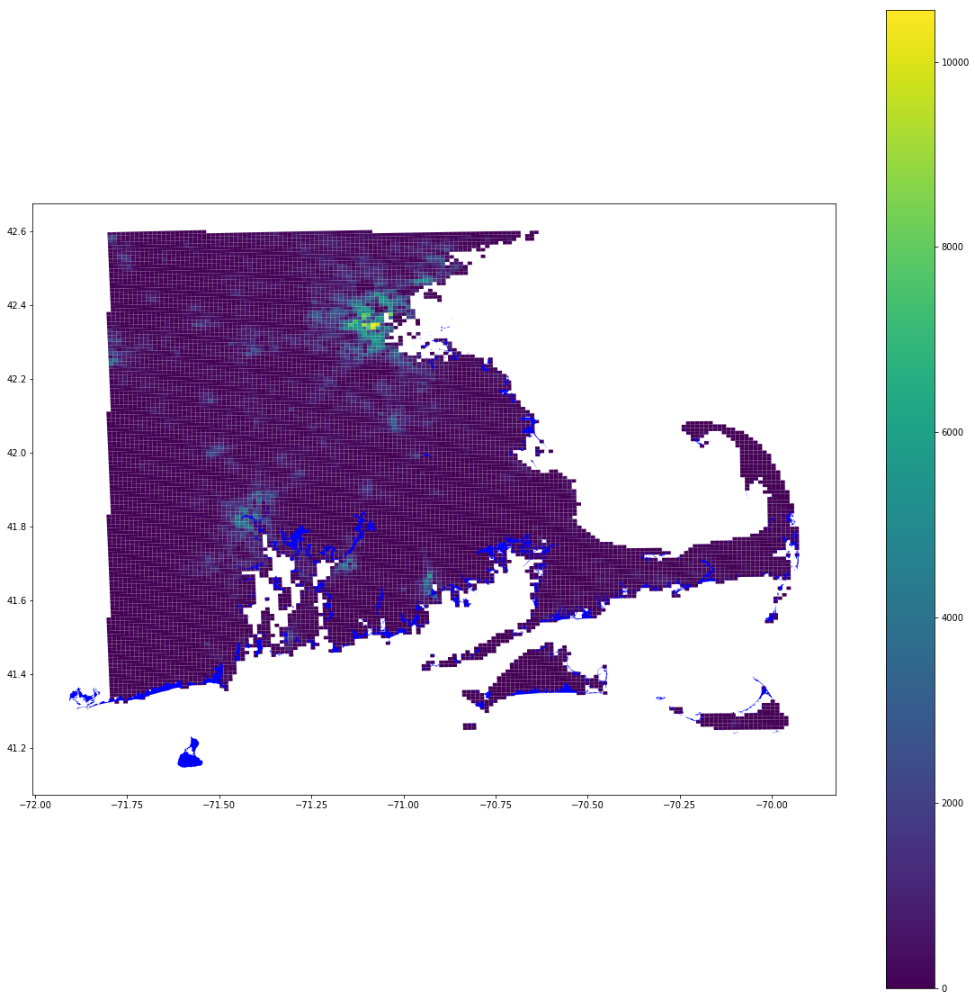

In [15]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
original_grid.plot(ax=ax, column='population', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

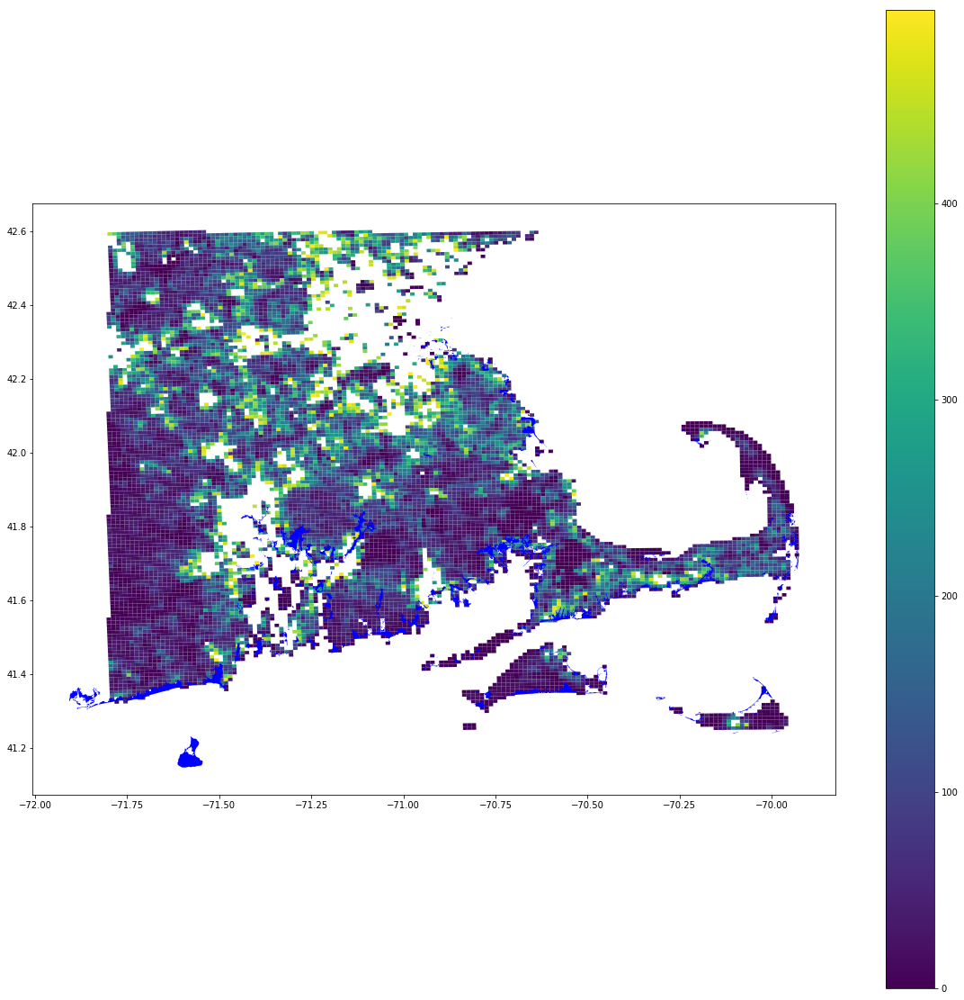

In [66]:
low_pop=original_grid.loc[original_grid['population']<500]
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
low_pop.plot(ax=ax, column='population', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

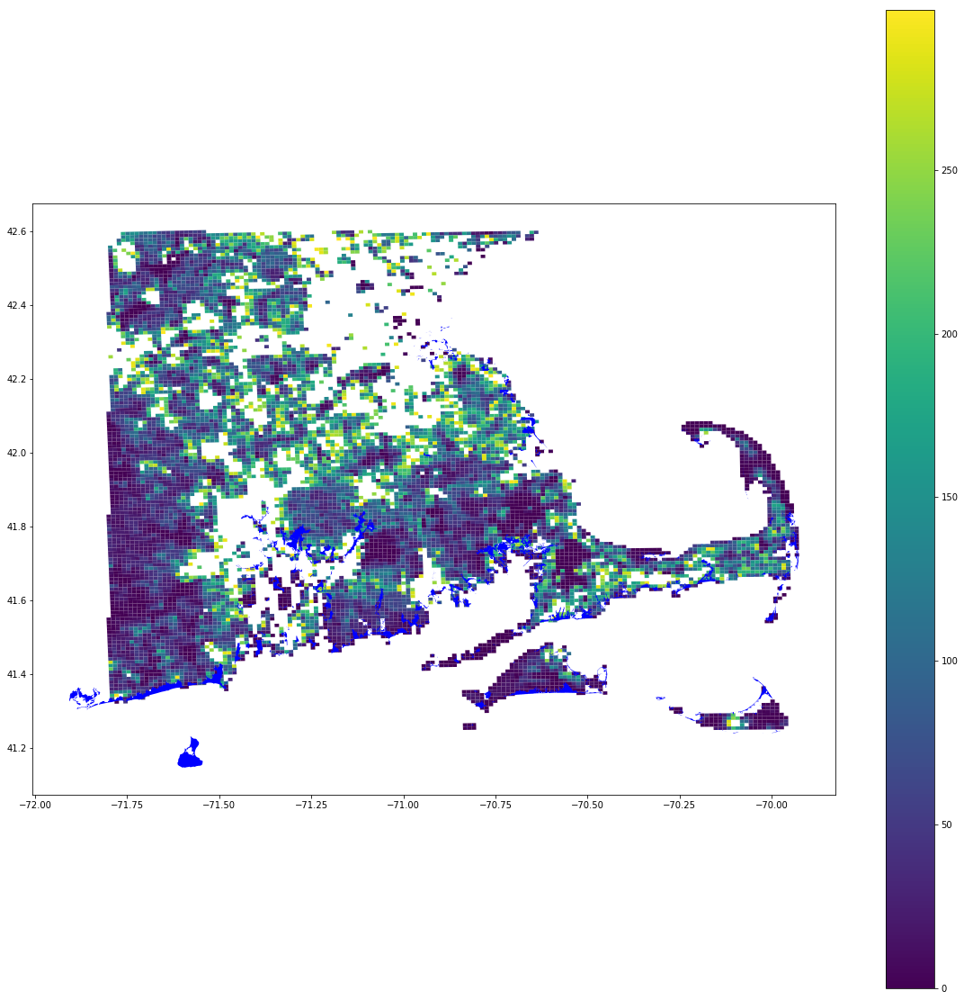

In [67]:
low_pop=original_grid.loc[original_grid['population']<300]
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
low_pop.plot(ax=ax, column='population', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

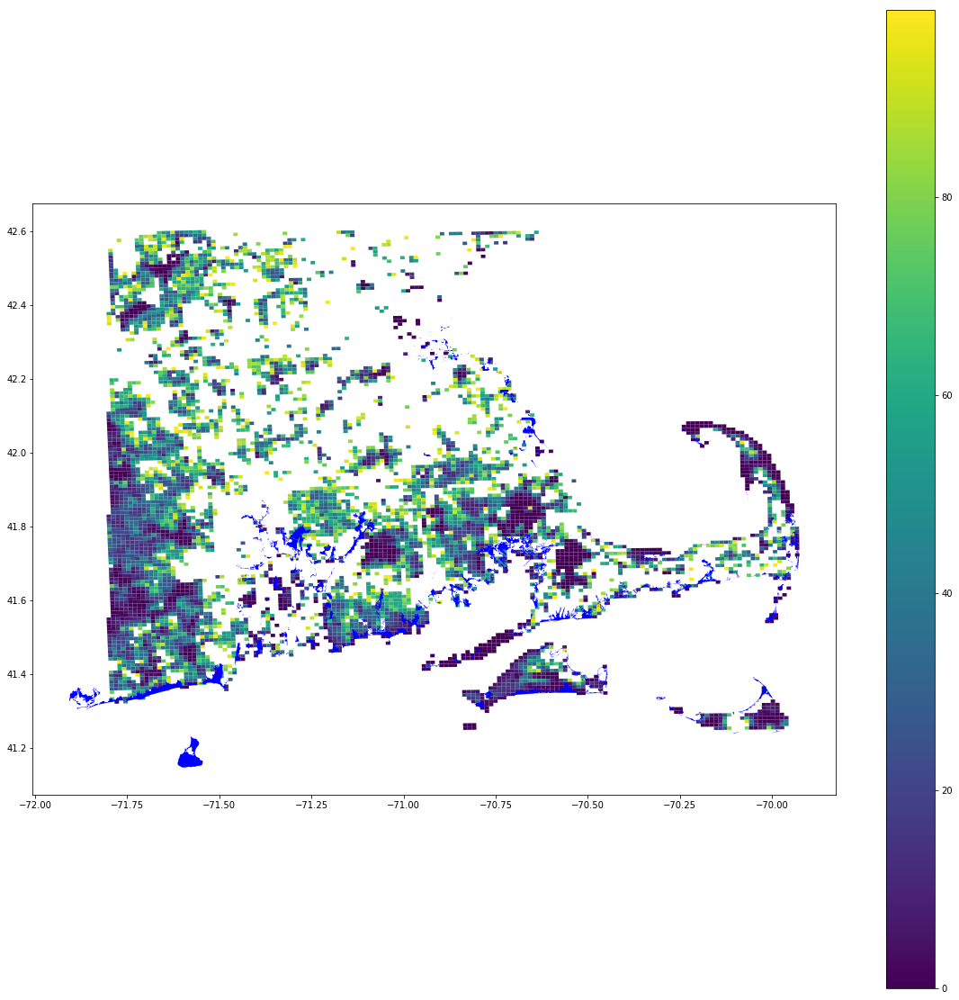

In [68]:
low_pop=original_grid.loc[original_grid['population']<100]
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
low_pop.plot(ax=ax, column='population', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

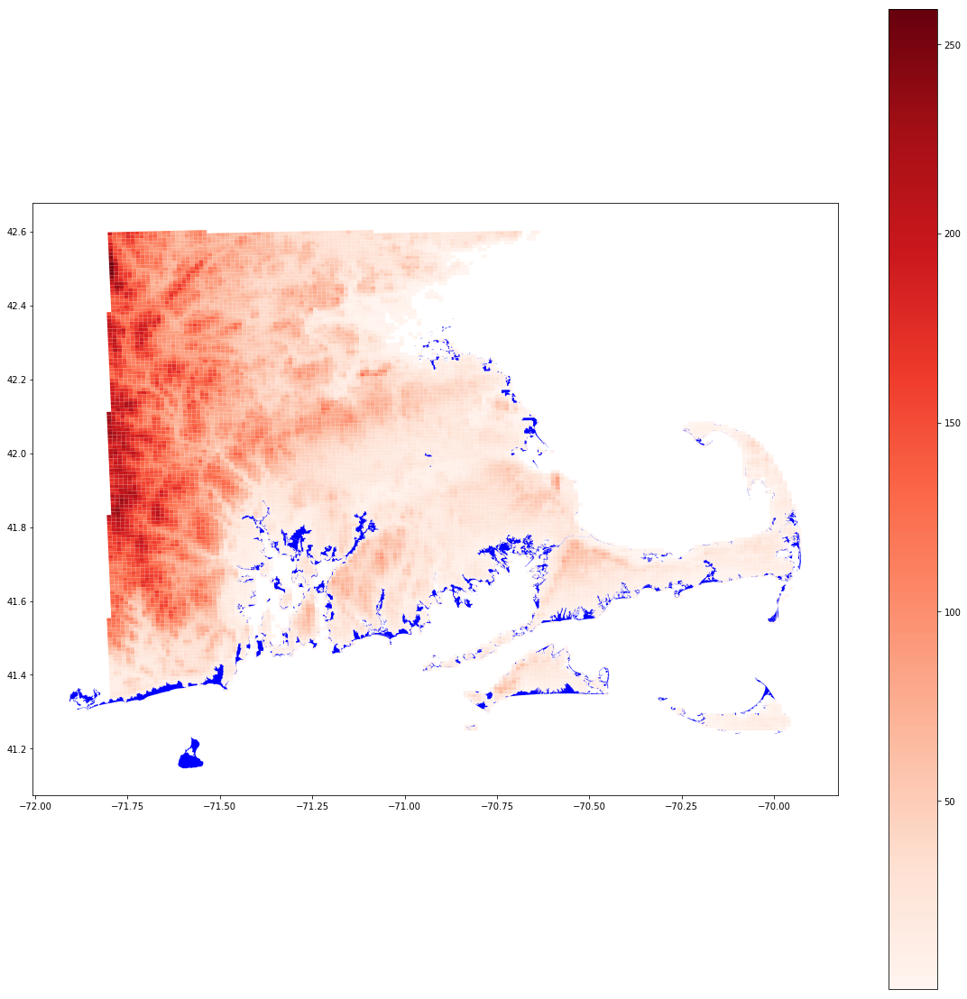

In [20]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
original_grid.plot(ax=ax, column='elevation', legend=True, cmap='Reds')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

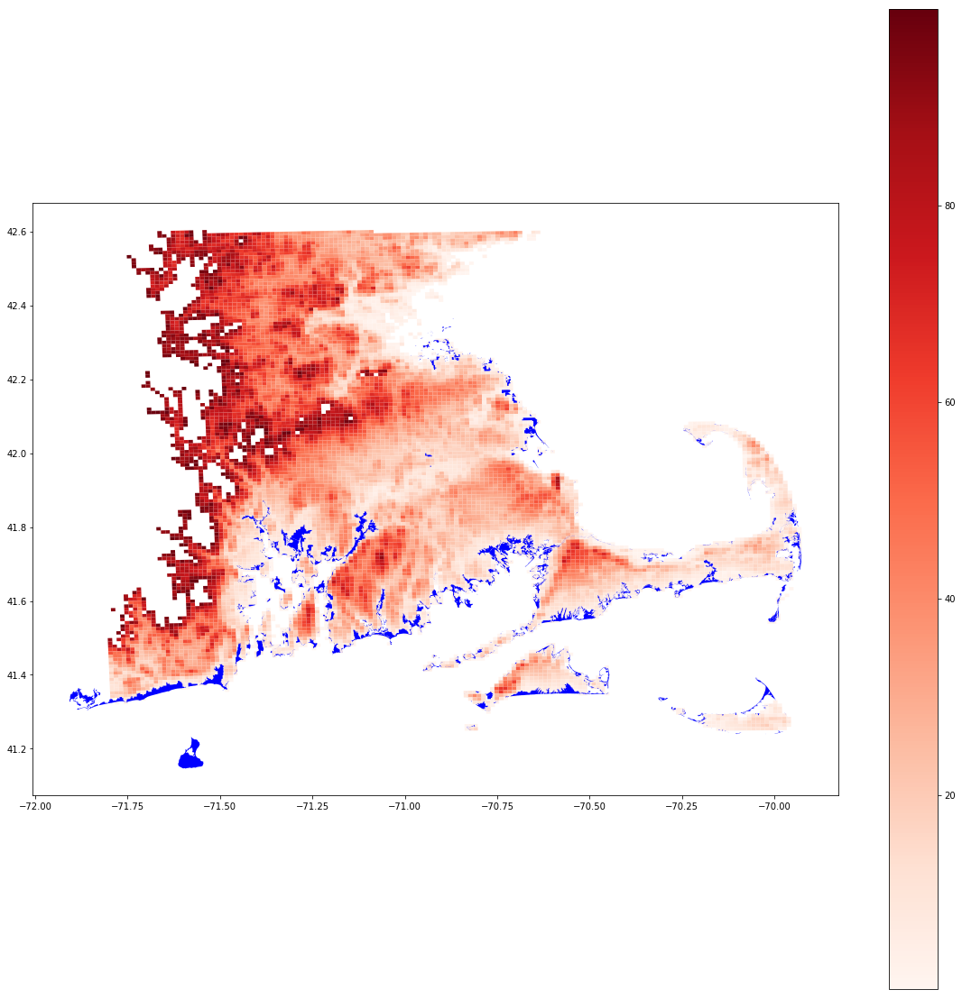

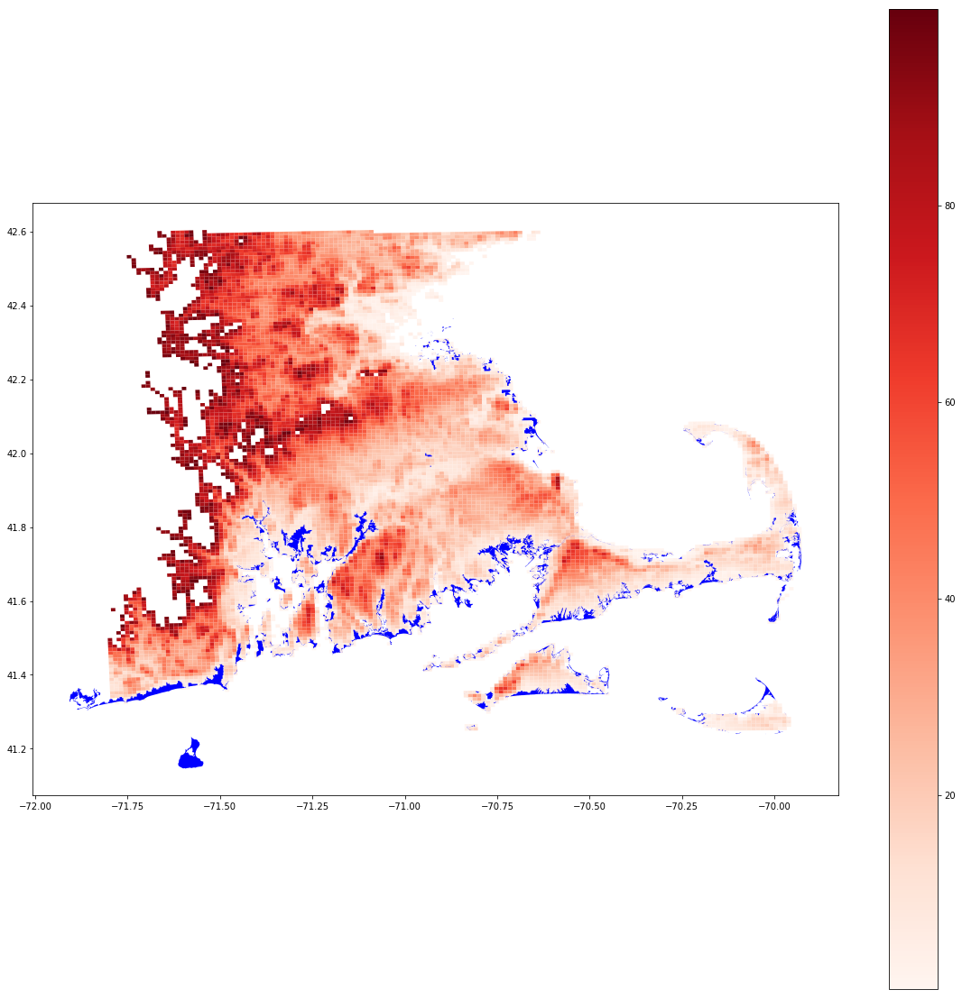

In [23]:
low=original_grid.loc[original_grid['elevation']<100]
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
low.plot(ax=ax, column='elevation', legend=True, cmap='Reds')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)

In [0]:
status=gpd.read_file('game1/prep_turn_1/facilities_status.shp')

In [0]:
#hospitals

In [0]:
hospitals=gpd.read_file('game_grid_export/facilities/hospitals.shp')
shelters=gpd.read_file('game_grid_export/facilities/shelters.shp')
plants=gpd.read_file('game_grid_export/facilities/powerplants.shp')
towers=gpd.read_file('game_grid_export/facilities/cell_towers.shp')
stations=gpd.read_file('game_grid_export/facilities/fire_stations.shp')
local_eo=gpd.read_file('game_grid_export/facilities/local_eocs.shp')
state_eo=gpd.read_file('game_grid_export/facilities/state_eocs.shp')
big_hospitals=hospitals[hospitals['BEDS']>=200]
small_hospitals=hospitals[hospitals['BEDS']<200]
EMS=gpd.read_file('game_grid_export/facilities/EMS.shp')
big_EMS=EMS[EMS['TOTAL_VEHI']>=5]
small_EMS=EMS[EMS['TOTAL_VEHI']<5]
change=game_grid.copy()
change['Health']=game_grid['Health']-original_grid['Health']
change['Utility']=game_grid['Utility']-original_grid['Utility']
change['Transporta']=game_grid['Transporta']-original_grid['Transporta']
airfields=gpd.read_file('game_grid_export/facilities/airfields.shp')

In [0]:
big_hospitals_data=gpd.sjoin(big_hospitals, game_grid)#, status, how='outer', left_on='geometry', right_on='geometry')
eff_big_hospitals=big_hospitals_data[big_hospitals_data['Utility']>=8]
dead_big_hospitals=big_hospitals_data[big_hospitals_data['Utility']<8]
small_hospitals_data=gpd.sjoin(small_hospitals, game_grid)
eff_small_hospitals=small_hospitals_data[small_hospitals_data['Utility']>=7]
dead_small_hospitals=small_hospitals_data[small_hospitals_data['Utility']<7]
big_EMS_data=gpd.sjoin(big_EMS, game_grid)
eff_big_EMS=big_EMS_data[big_EMS_data['Utility']>=6]
dead_big_EMS=big_EMS_data[big_EMS_data['Utility']<6]
small_EMS_data=gpd.sjoin(small_EMS, game_grid)
eff_small_EMS=small_EMS_data[small_EMS_data['Utility']>=6]
dead_small_EMS=small_EMS_data[small_EMS_data['Utility']<6]
plants_data=gpd.sjoin(plants, game_grid)
eff_plants=plants_data[plants_data['Utility']>=3]
dead_plants=plants_data[plants_data['Utility']<3]
stations_data=gpd.sjoin(stations, game_grid)
eff_stations=stations_data[stations_data['Utility']>=7]
dead_stations=stations_data[stations_data['Utility']<7]
towers_data=gpd.sjoin(towers, game_grid)
eff_towers=towers_data[towers_data['Utility']>=8]
dead_towers=towers_data[towers_data['Utility']<8]
shelters_data=gpd.sjoin(shelters, game_grid)
eff_shelters=shelters_data[shelters_data['Utility']>=3]
dead_shelters=shelters_data[shelters_data['Utility']<3]
airfields_data=gpd.sjoin(airfields, game_grid)
eff_airfields=airfields_data[airfields_data['Utility']>=6]
dead_airfields=airfields_data[airfields_data['Utility']<6]
lcl_eo_data=gpd.sjoin(local_eo, game_grid)
eff_lcl_eo=lcl_eo_data[lcl_eo_data['Utility']>=6]
dead_lcl_eo=lcl_eo_data[lcl_eo_data['Utility']<6]
stt_eo_data=gpd.sjoin(state_eo, game_grid)
eff_stt_eo=stt_eo_data[stt_eo_data['Utility']>=7]
dead_stt_eo=stt_eo_data[stt_eo_data['Utility']<7]

In [0]:
dead_big_hospitals.to_csv('/content/dead_big_hospitals.csv')
dead_small_hospitals.to_csv('/content/dead_small_hospitals.csv')
dead_big_EMS.to_csv('/content/dead_big_EMS.csv')
dead_small_EMS.to_csv('/content/dead_small_EMS.csv')
dead_stt_eo.to_csv('/content/dead_stt_eo.csv')
dead_lcl_eo.to_csv('/content/dead_lcl_eo.csv')
dead_plants.to_csv('/content/dead_plants.csv')
dead_towers.to_csv('/content/dead_plants.csv')

In [0]:
#print(len(hospitals))
#print(len(small_hospitals))
#print(len(big_hospitals))
#print(len(plants))
#print(len(towers))
#print(len(stations))
#print(len(local_eo))
#print(len(state_eo))
#print(len(small_EMS))
#print(len(big_EMS))

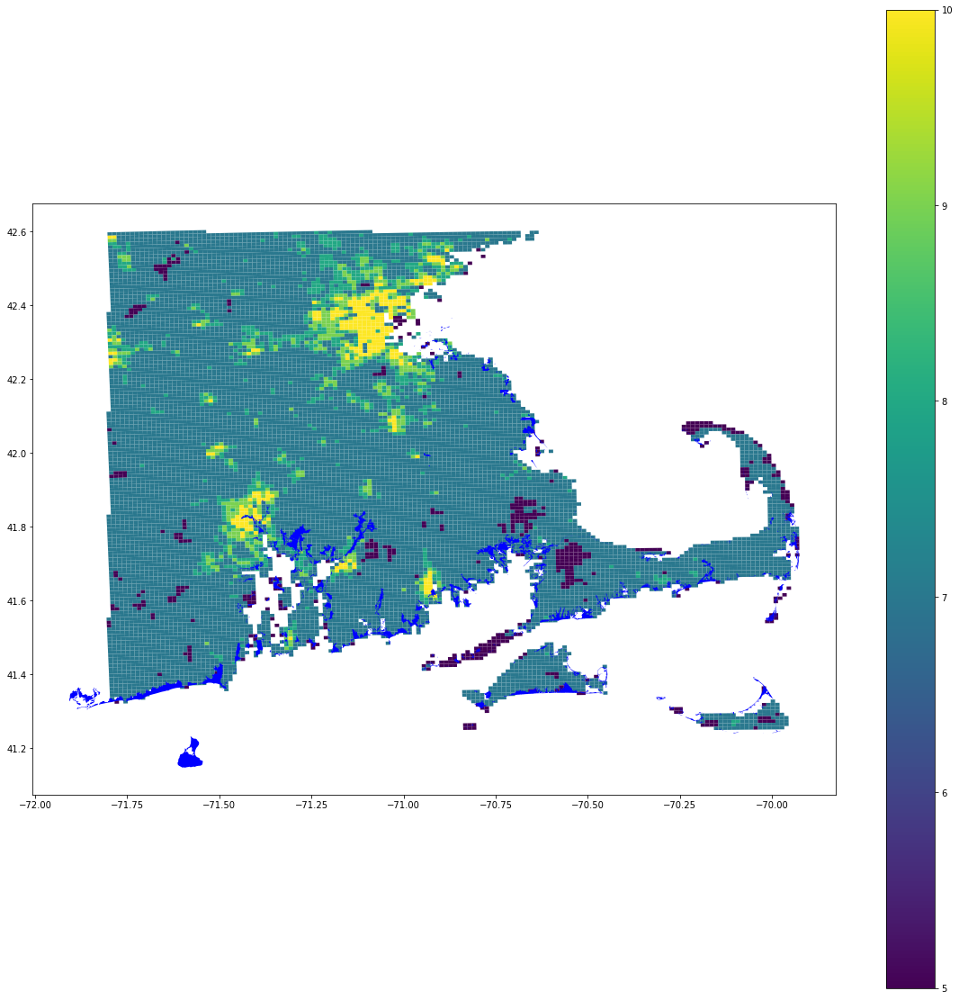

In [27]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)

In [0]:
#flood_pop=gpd.sjoin(flooding, game_grid)
#flood_pop

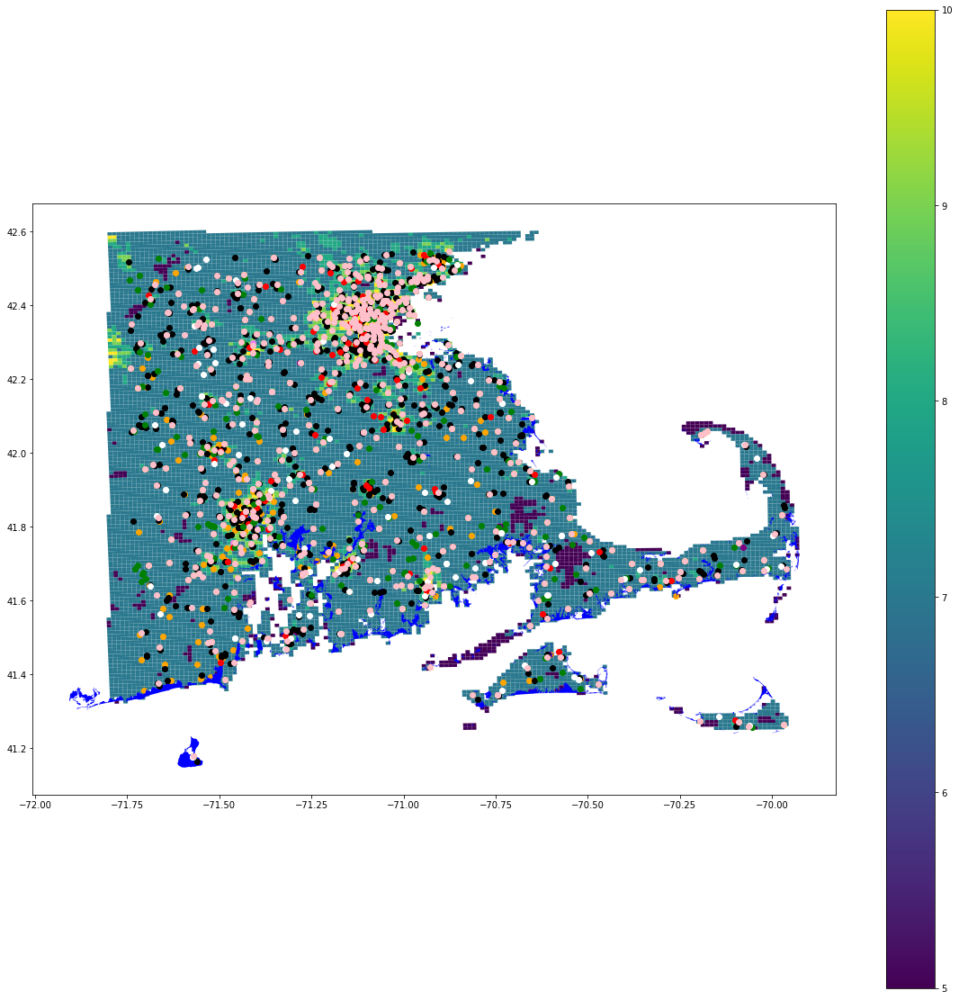

In [29]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
shelters.to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10)
plants.to_crs(game_grid.crs).plot(color='green', ax=ax, zorder=15)
towers.to_crs(game_grid.crs).plot(color='white', ax=ax, zorder=15)
stations.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5)
local_eo.to_crs(game_grid.crs).plot(color='purple', ax=ax, zorder=5)
state_eo.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)
EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=15)

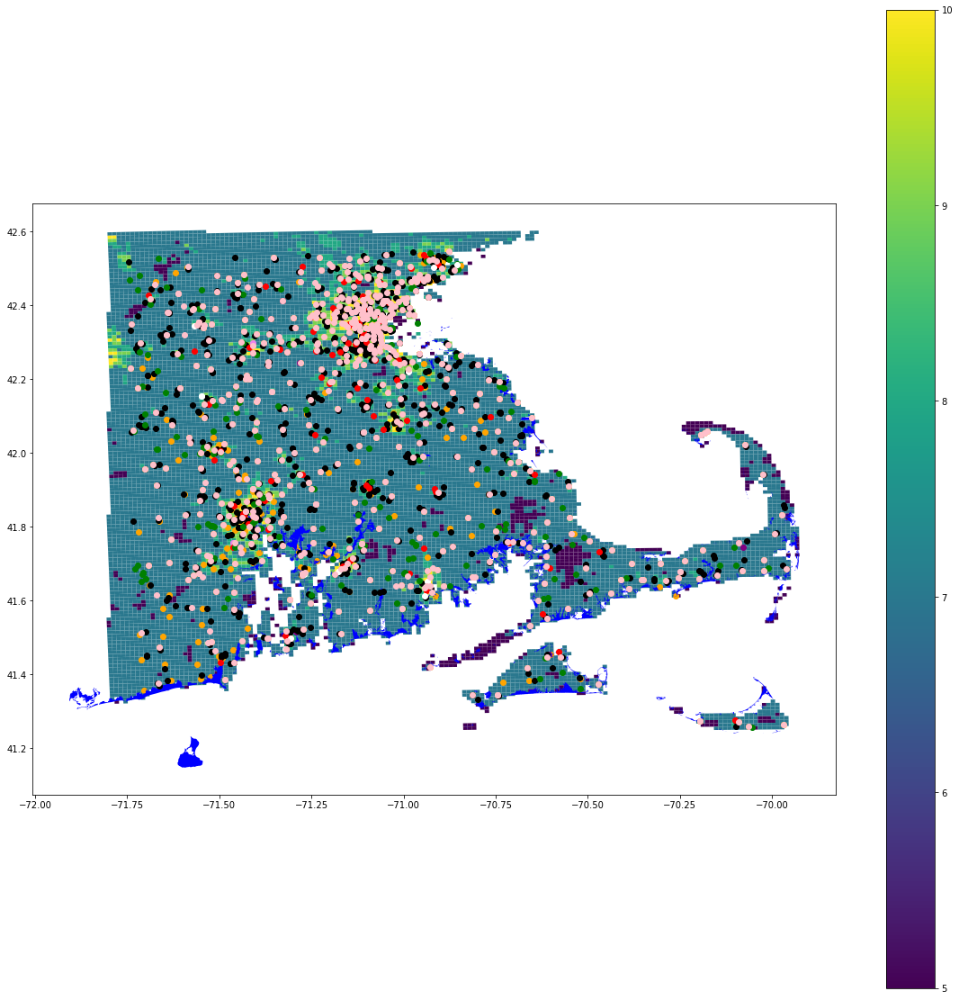

In [30]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
eff_big_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
eff_small_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_shelters.to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10)
eff_plants.to_crs(game_grid.crs).plot(color='green', ax=ax, zorder=15)
eff_towers.to_crs(game_grid.crs).plot(color='white', ax=ax, zorder=15)
eff_stations.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5)
eff_lcl_eo.to_crs(game_grid.crs).plot(color='purple', ax=ax, zorder=5)
eff_stt_eo.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)
eff_small_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=15)
eff_big_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=15)

/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:418: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  "empty. Nothing has been displayed.", UserWarning)


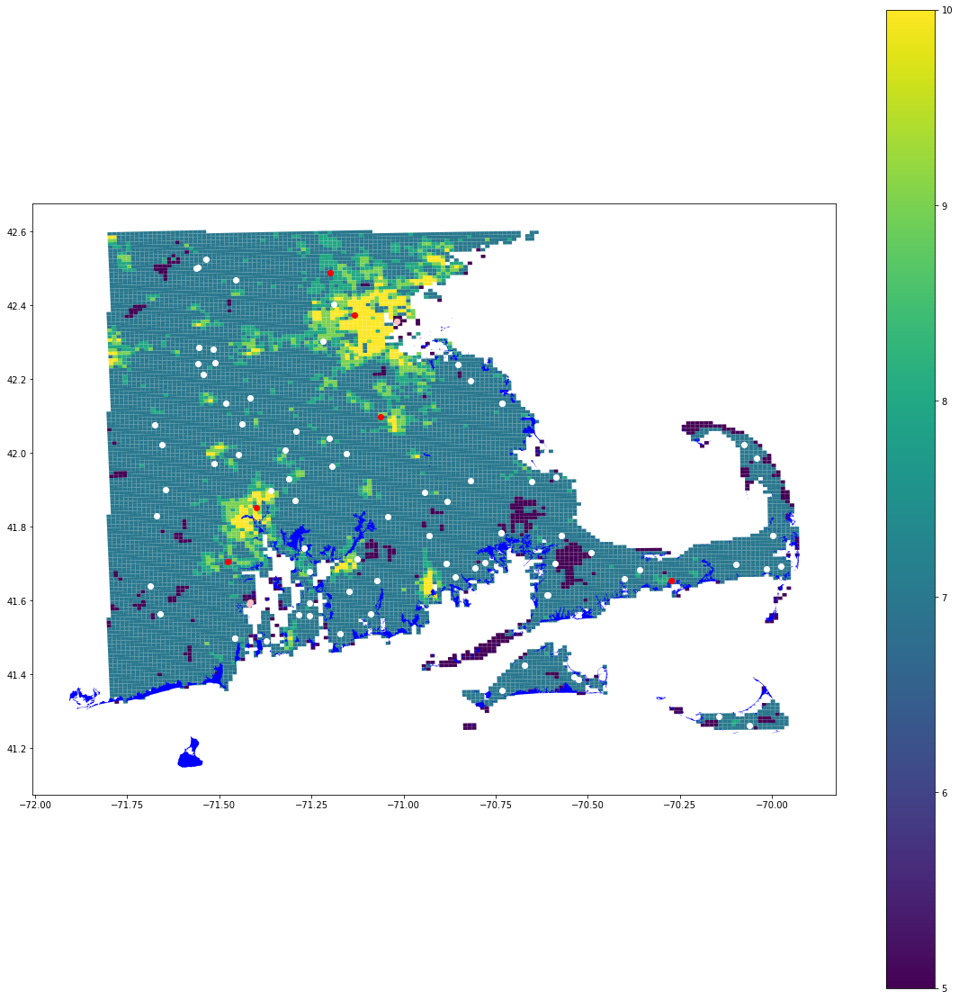

In [31]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
dead_big_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
dead_small_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
dead_shelters.to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10)
dead_plants.to_crs(game_grid.crs).plot(color='green', ax=ax, zorder=15)
dead_towers.to_crs(game_grid.crs).plot(color='white', ax=ax, zorder=15)
dead_stations.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5)
dead_lcl_eo.to_crs(game_grid.crs).plot(color='purple', ax=ax, zorder=5)
dead_stt_eo.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)
dead_small_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=15)
dead_big_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=15)

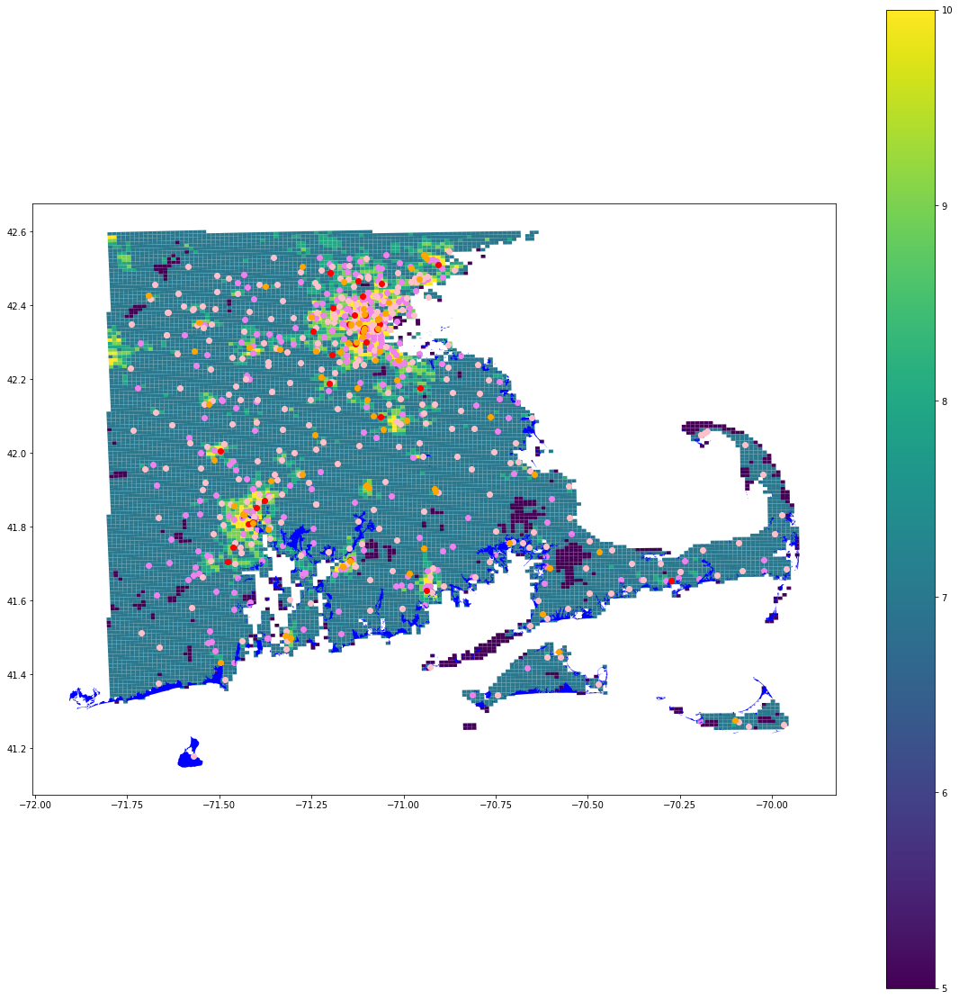

In [32]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
big_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
small_hospitals.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=15)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
small_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=10)
big_EMS.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)

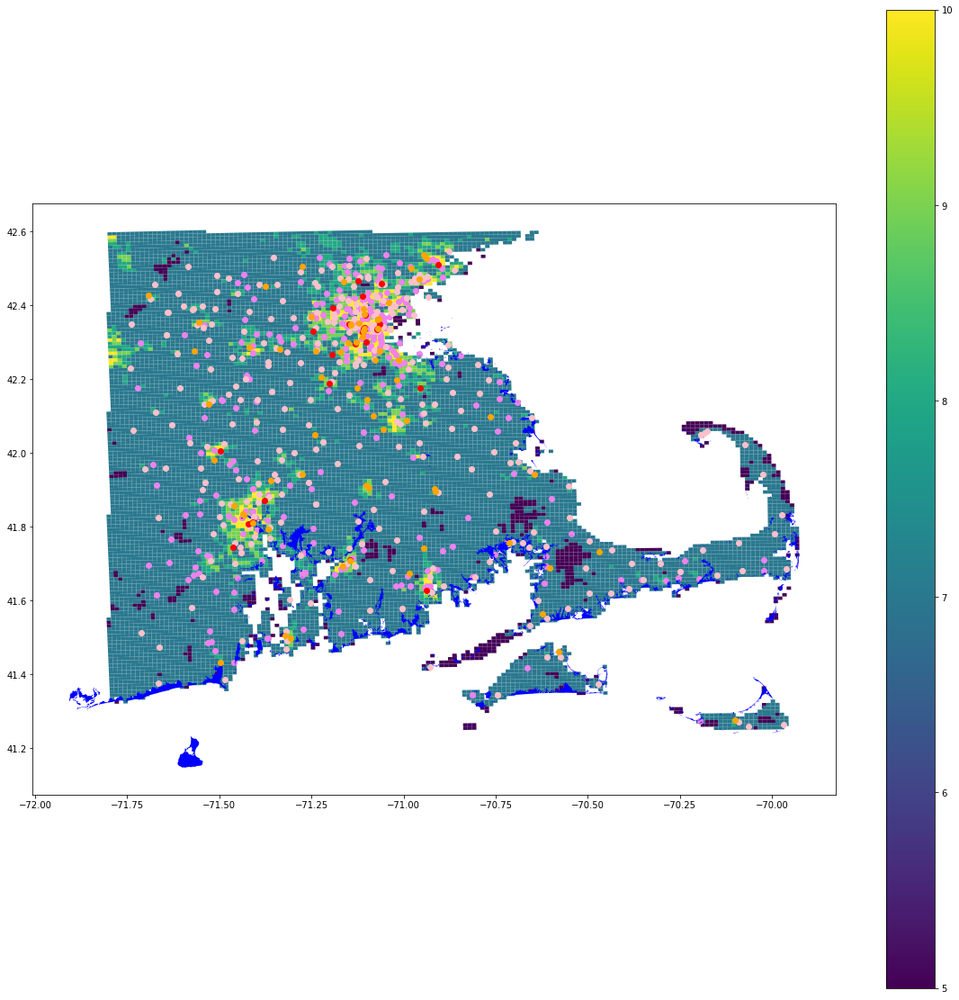

In [33]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
eff_big_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
eff_small_hospitals.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=15)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_small_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=10)
eff_big_EMS.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)

/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:418: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  "empty. Nothing has been displayed.", UserWarning)


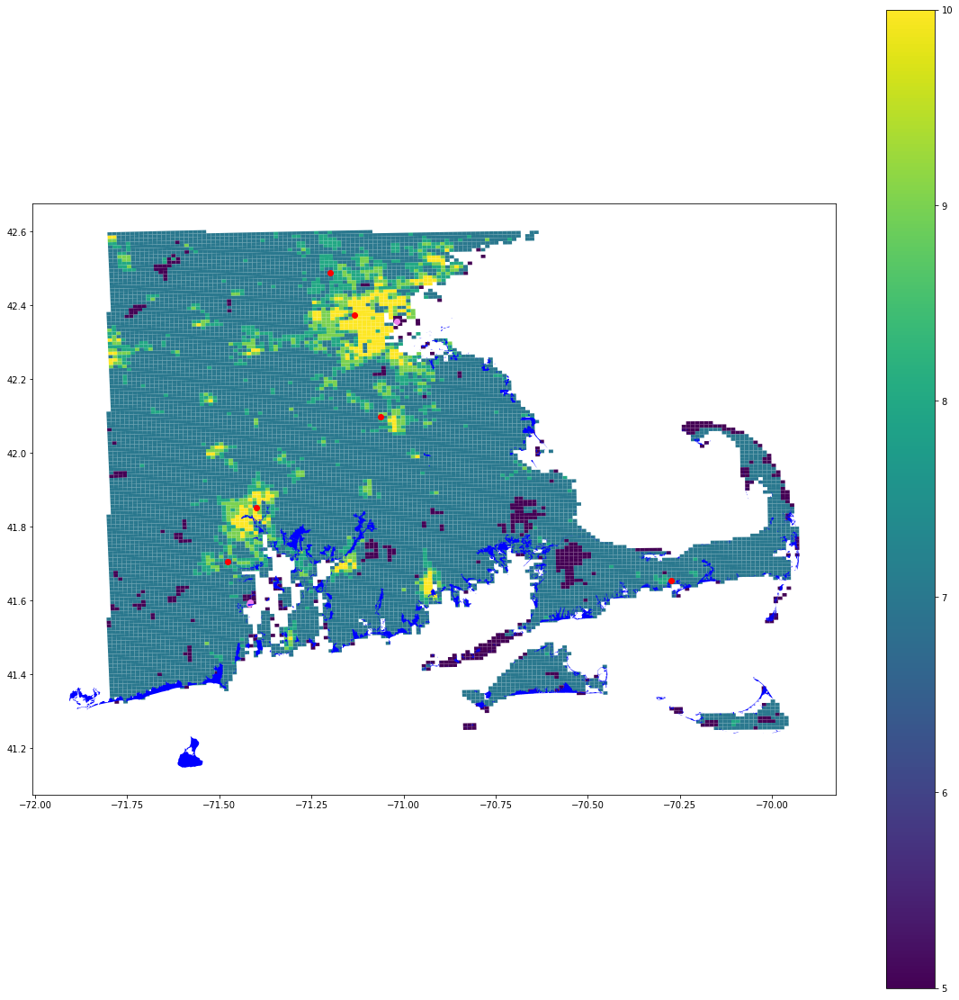

In [34]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
dead_big_hospitals.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)
dead_small_hospitals.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=15)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
dead_small_EMS.to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=10)
dead_big_EMS.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)

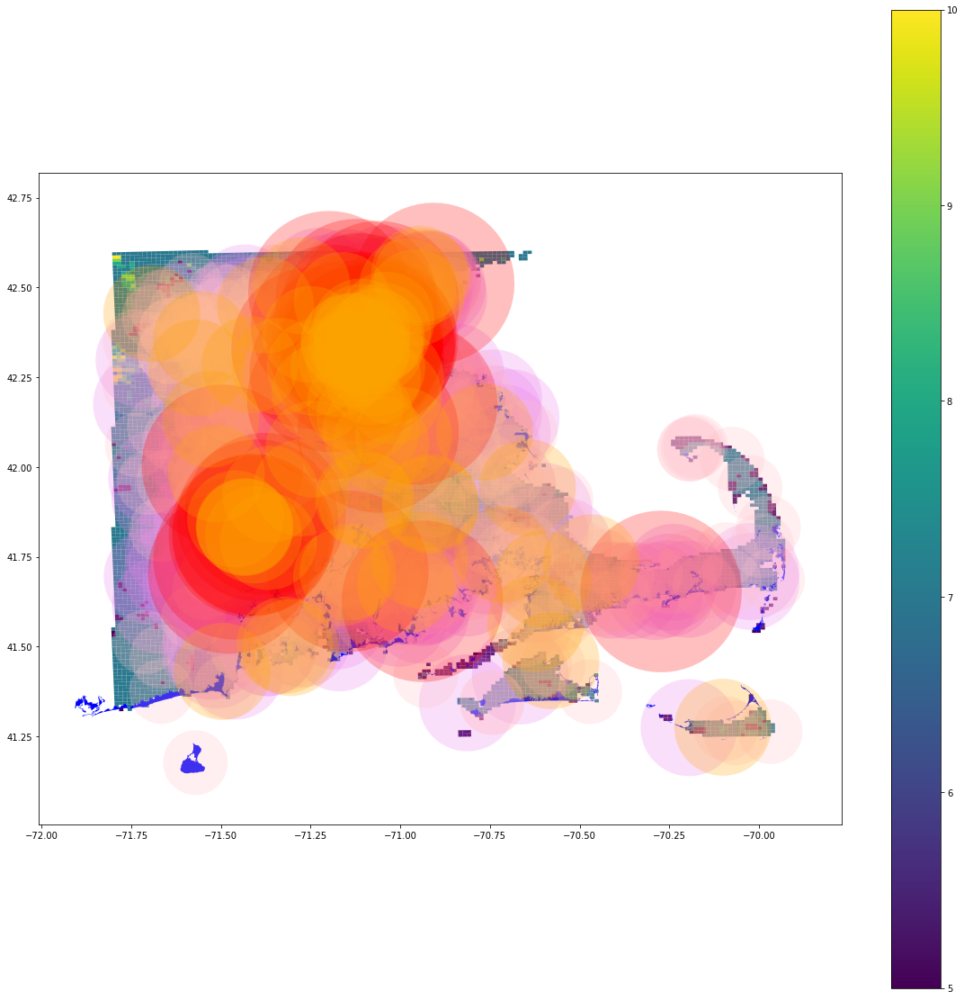

In [35]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
big_hospitals.buffer(0.22522522522).to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15, alpha=0.25)
small_hospitals.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=15, alpha=0.25)
small_EMS.buffer(0.09009009009).to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=10, alpha=0.25)
big_EMS.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5, alpha=0.25)

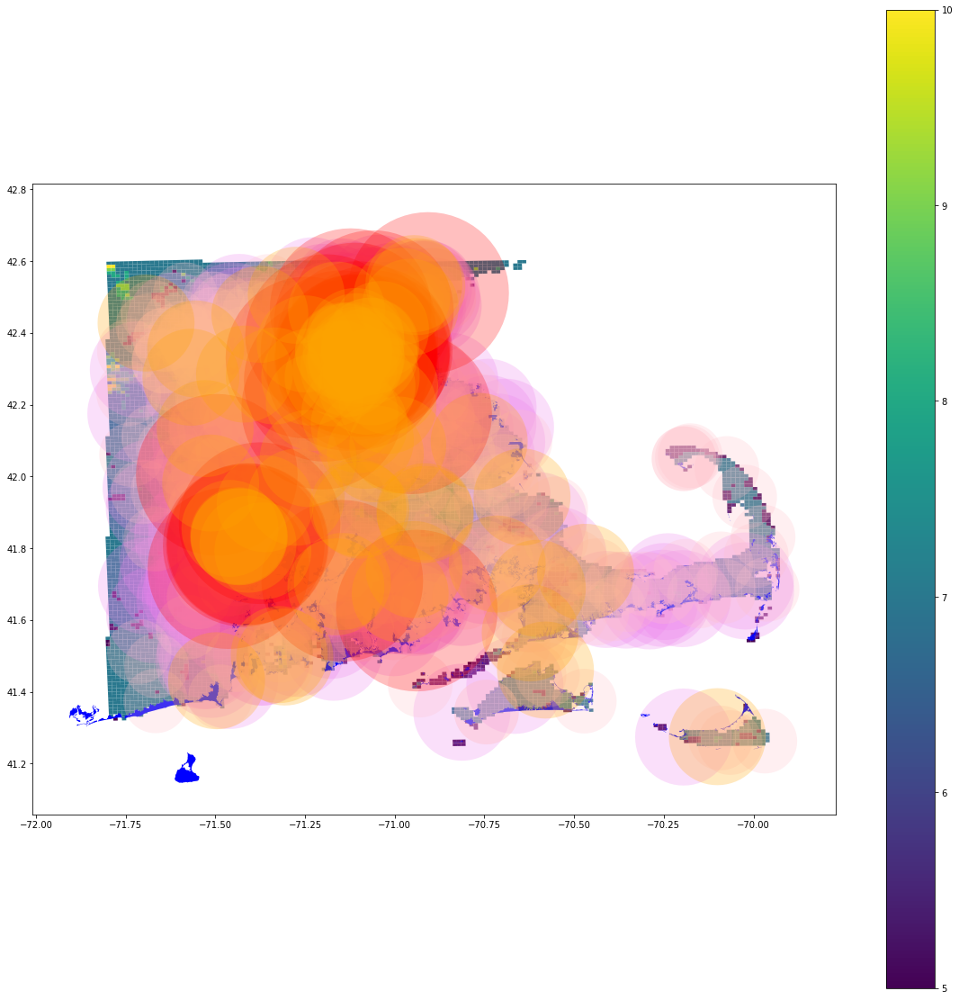

In [36]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_big_hospitals.buffer(0.22522522522).to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15, alpha=0.25)
eff_small_hospitals.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=15, alpha=0.25)
eff_small_EMS.buffer(0.09009009009).to_crs(game_grid.crs).plot(color='pink', ax=ax, zorder=10, alpha=0.25)
eff_big_EMS.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5, alpha=0.25)

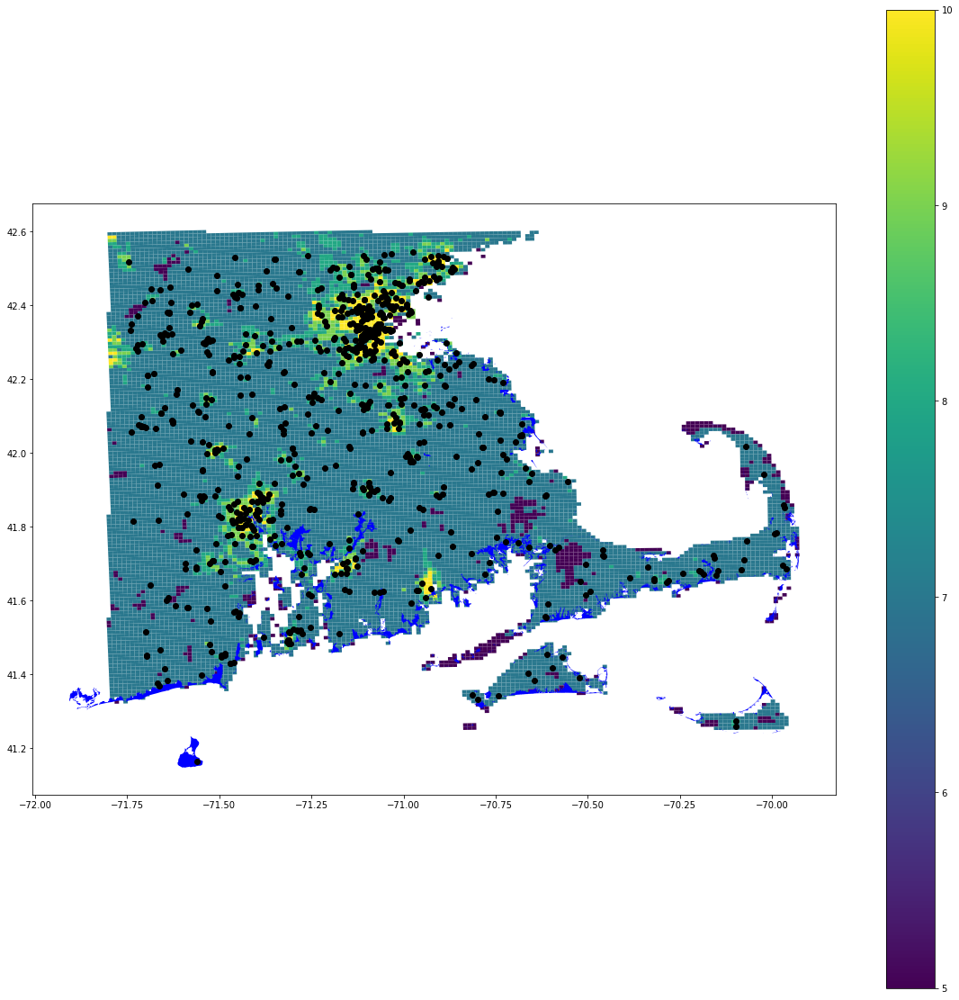

In [37]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
shelters.to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10)

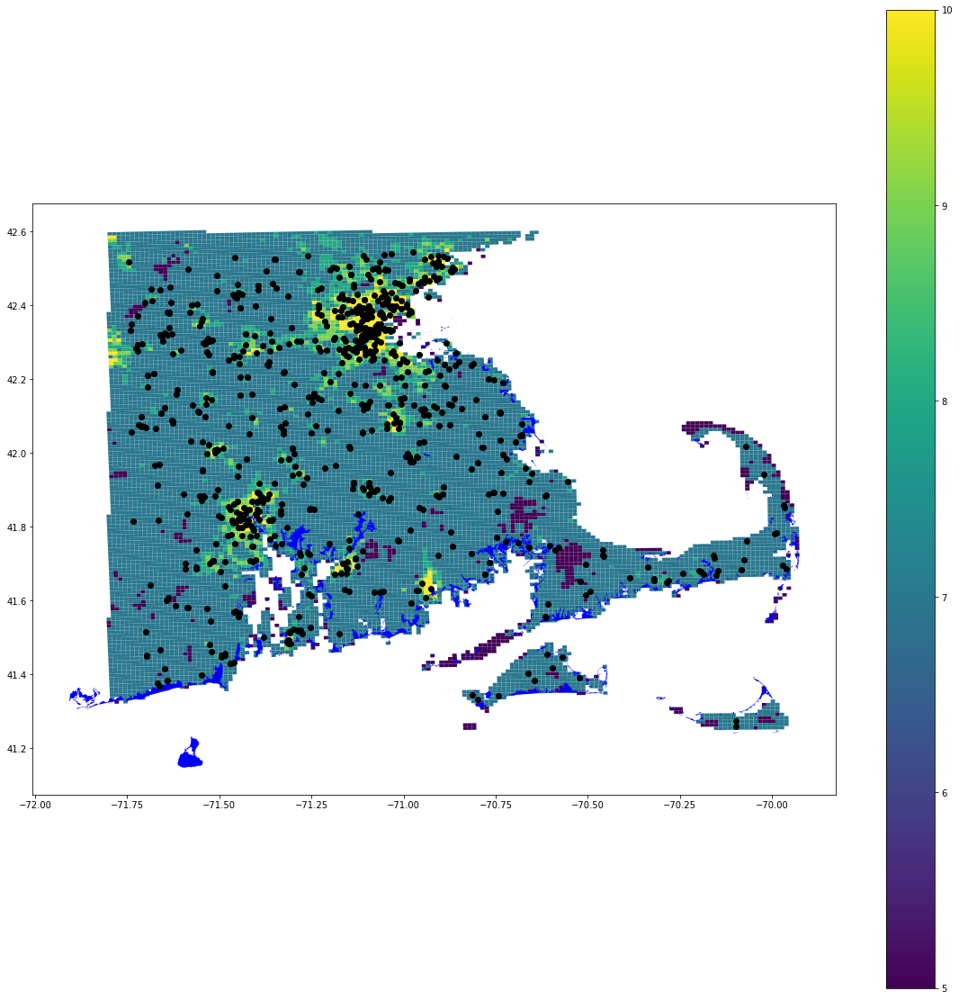

In [38]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_shelters.to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10)

/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:418: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  "empty. Nothing has been displayed.", UserWarning)


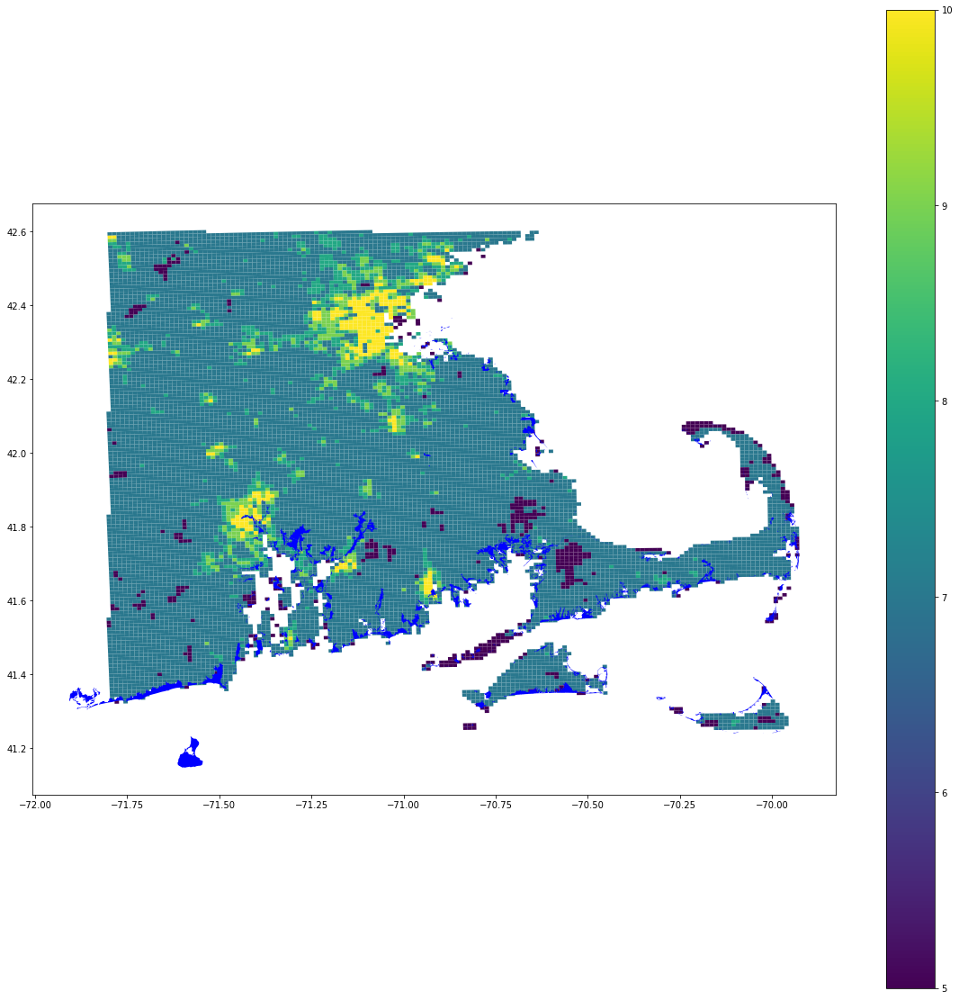

In [39]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
dead_shelters.to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10)

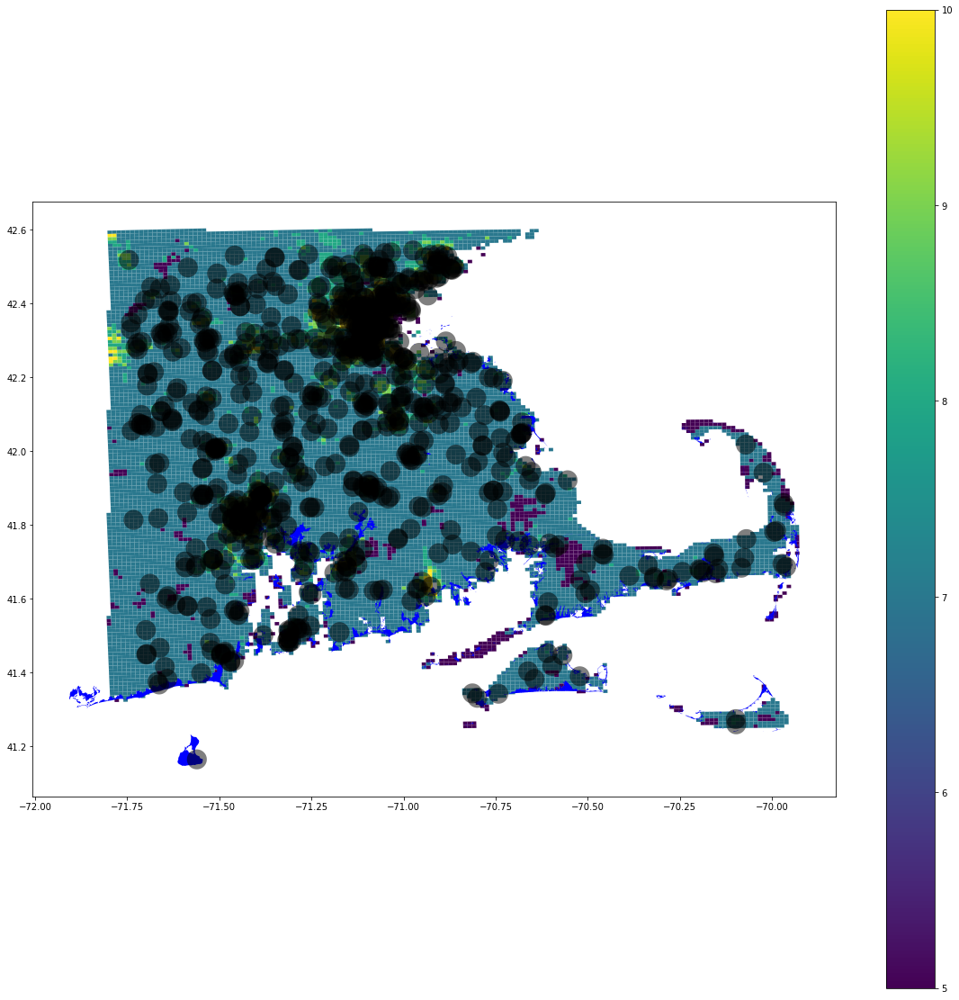

In [40]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
shelters.buffer(0.02702702702).to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10, alpha=.5)

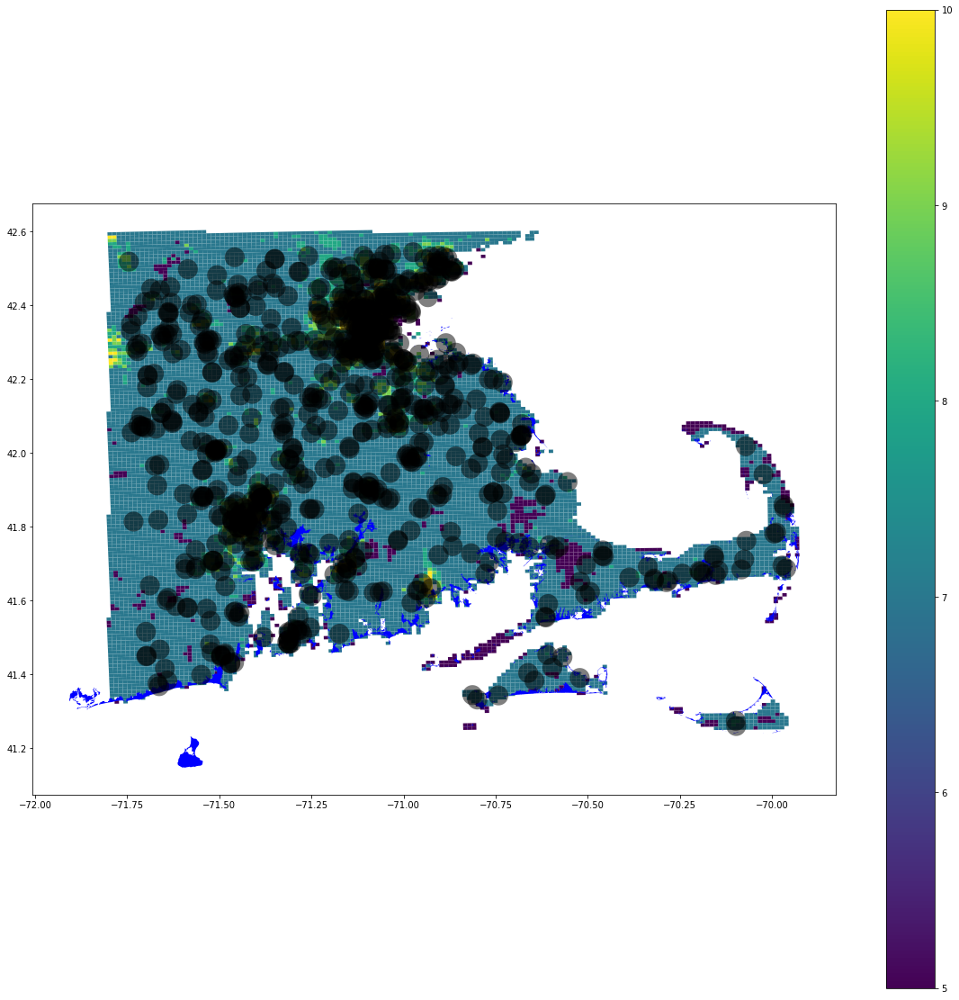

In [41]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_shelters.buffer(0.02702702702).to_crs(game_grid.crs).plot(color='black', ax=ax, zorder=10, alpha=.5)

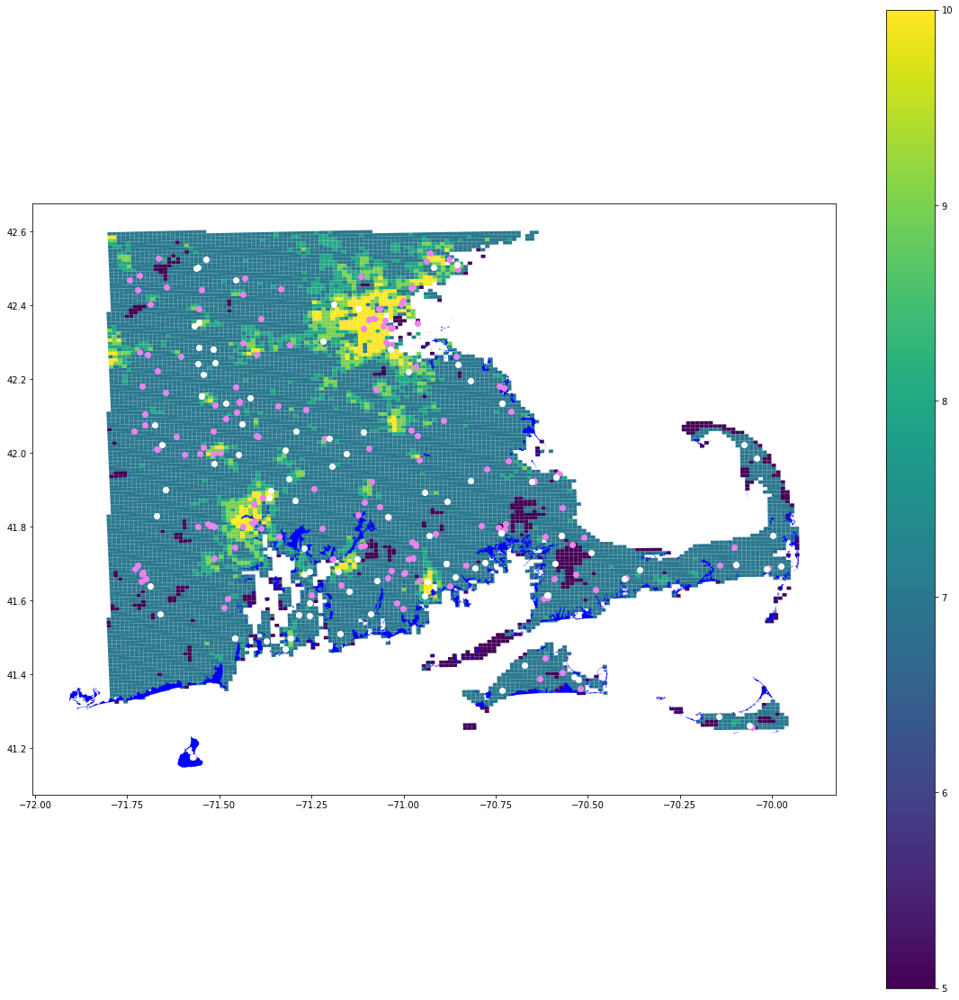

In [42]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
plants.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=15)
towers.to_crs(game_grid.crs).plot(color='white', ax=ax, zorder=15)

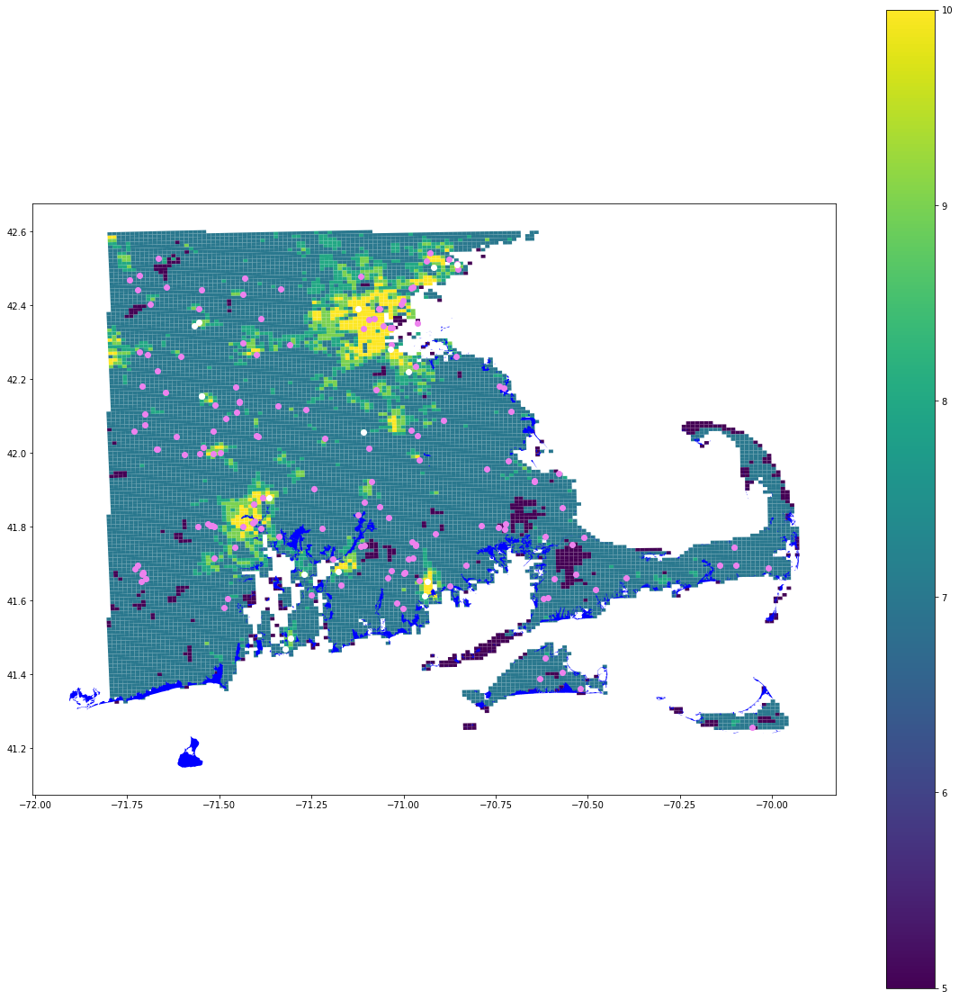

In [43]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_plants.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=15)
eff_towers.to_crs(game_grid.crs).plot(color='white', ax=ax, zorder=15)

/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:418: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  "empty. Nothing has been displayed.", UserWarning)


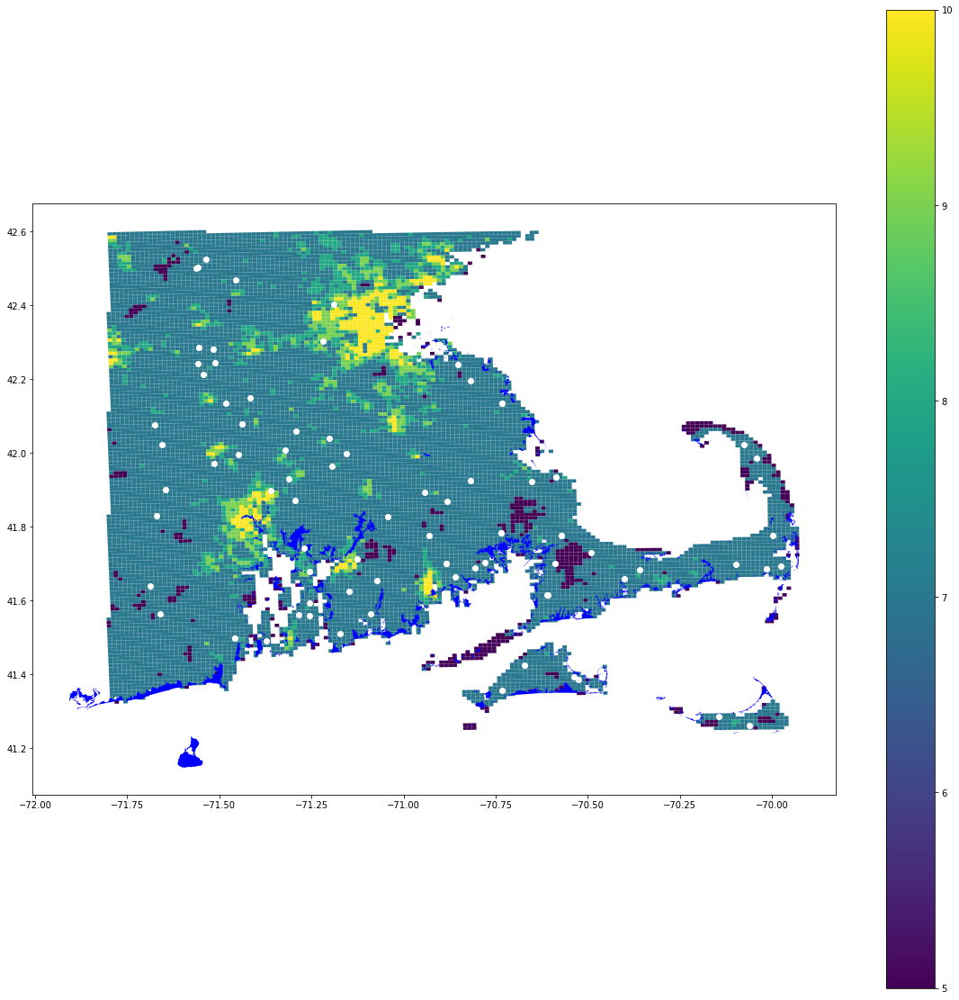

In [44]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
dead_plants.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=15)
dead_towers.to_crs(game_grid.crs).plot(color='white', ax=ax, zorder=15)

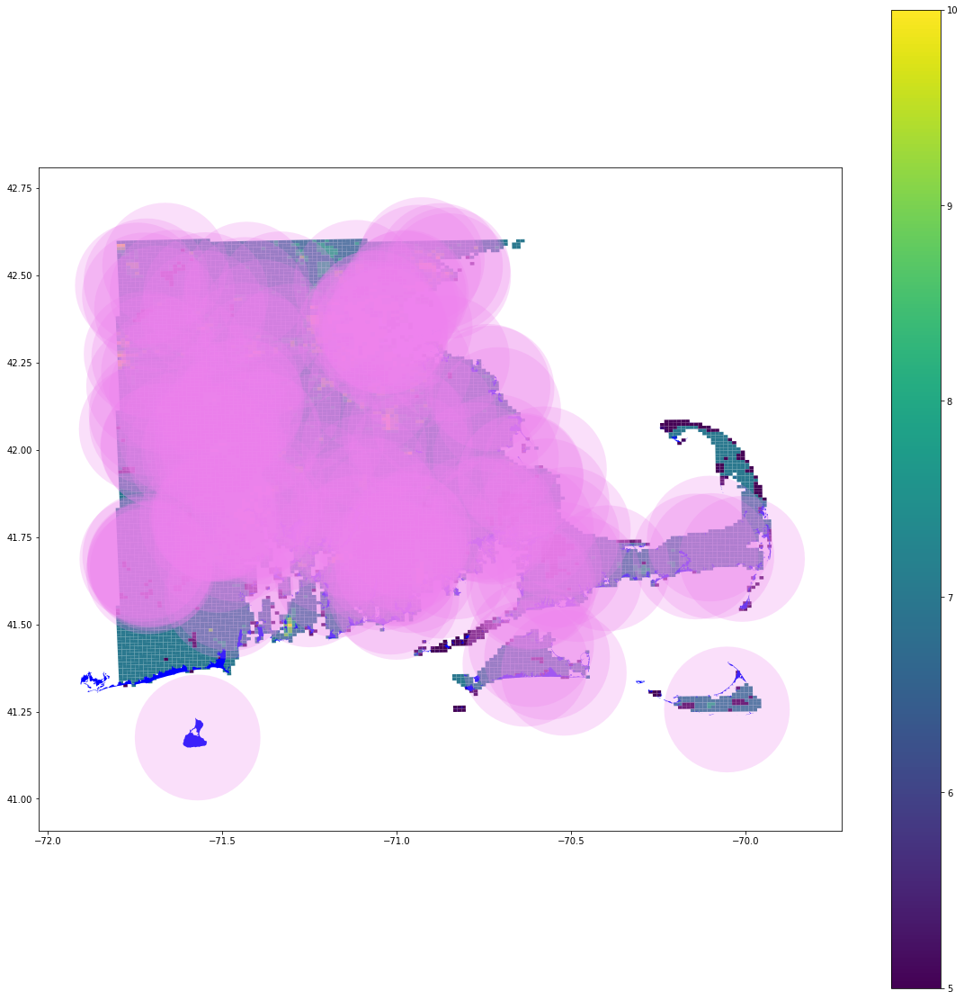

In [45]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
plants.buffer(0.18018018018).to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=20, alpha=0.25)

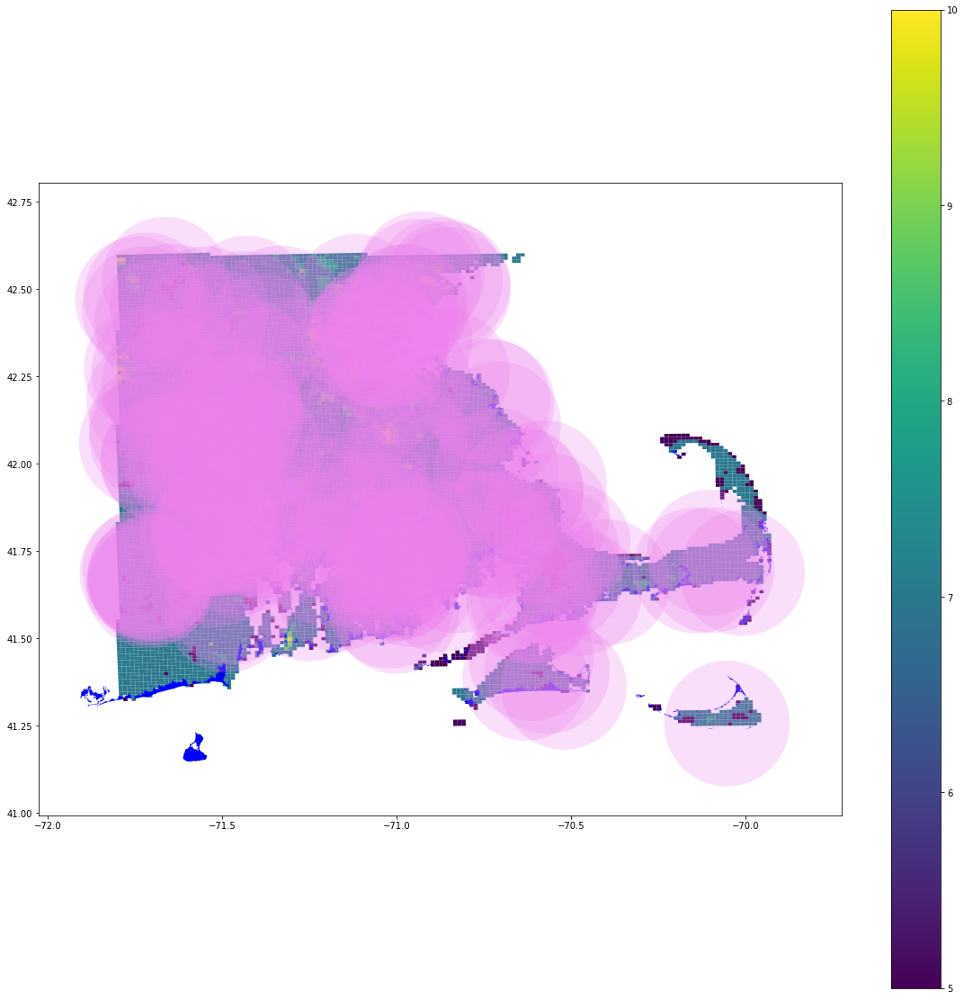

In [46]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_plants.buffer(0.18018018018).to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=20, alpha=0.25)

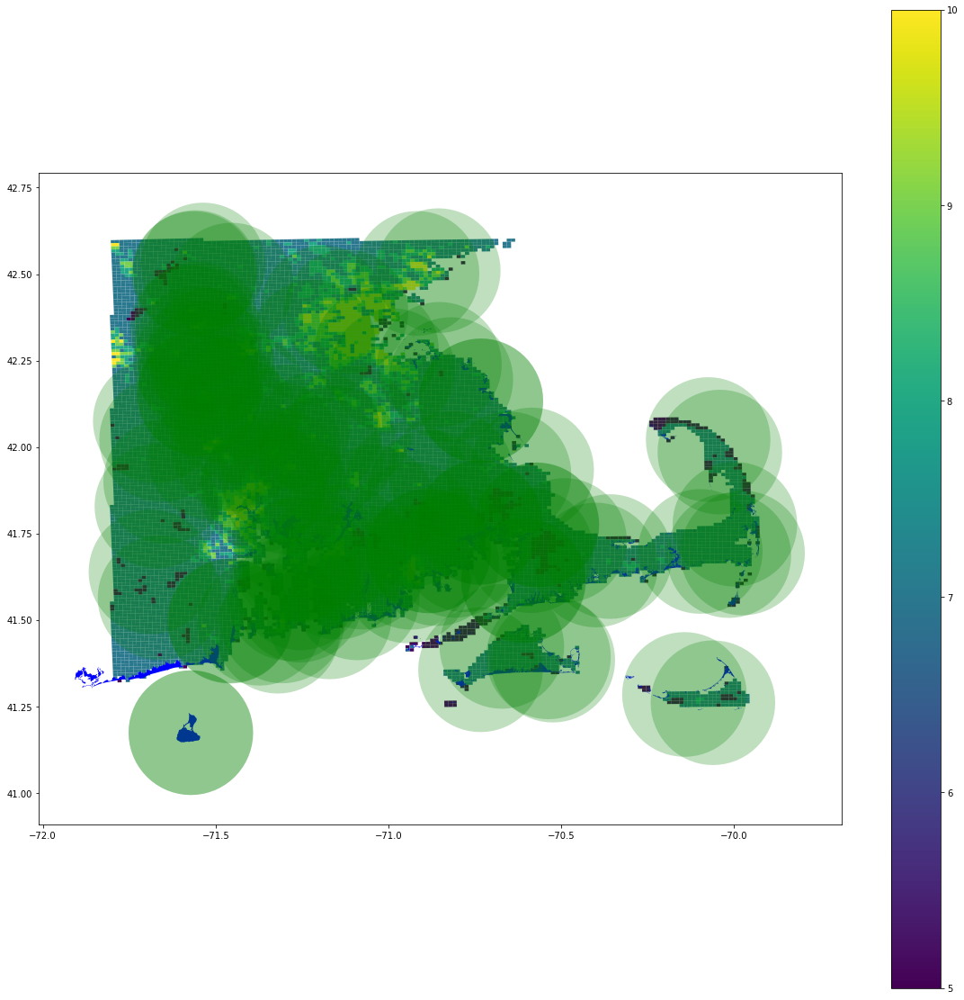

In [47]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
towers.buffer(0.18018018018).to_crs(game_grid.crs).plot(color='green', ax=ax, zorder=15, alpha=0.25)

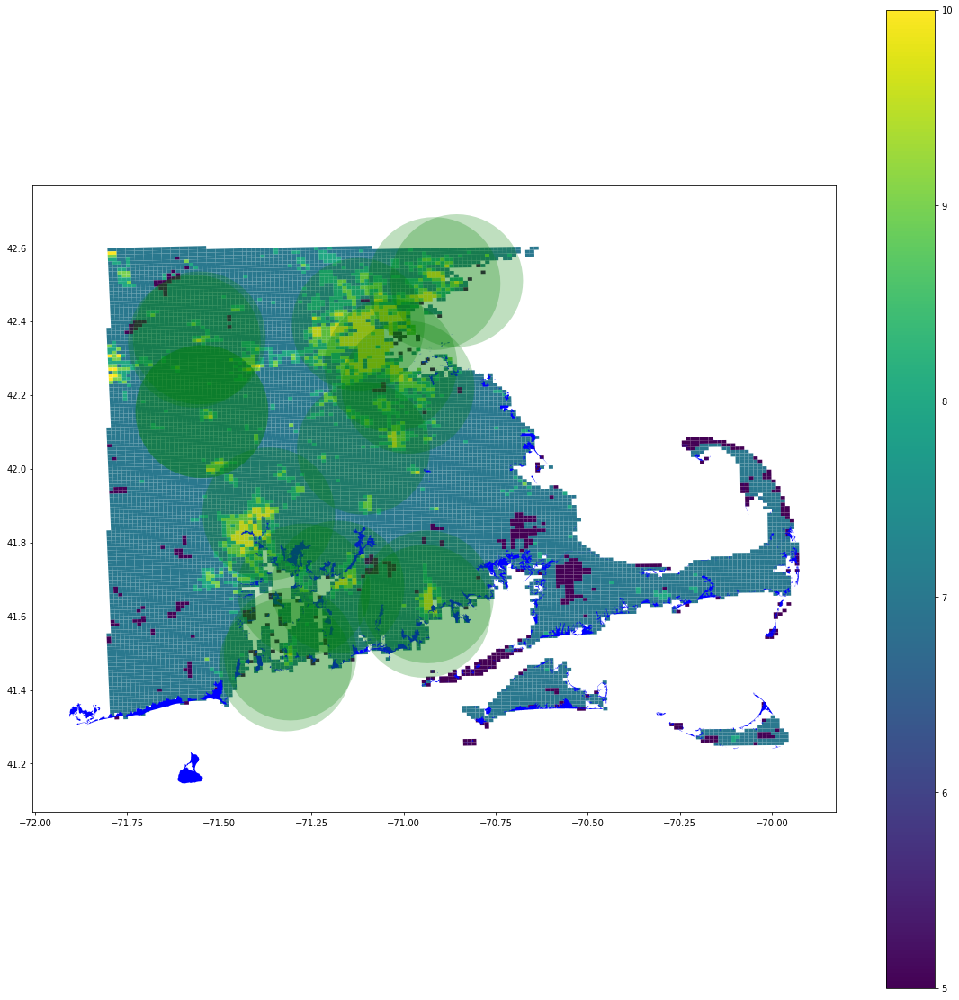

In [48]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_towers.buffer(0.18018018018).to_crs(game_grid.crs).plot(color='green', ax=ax, zorder=15, alpha=0.25)

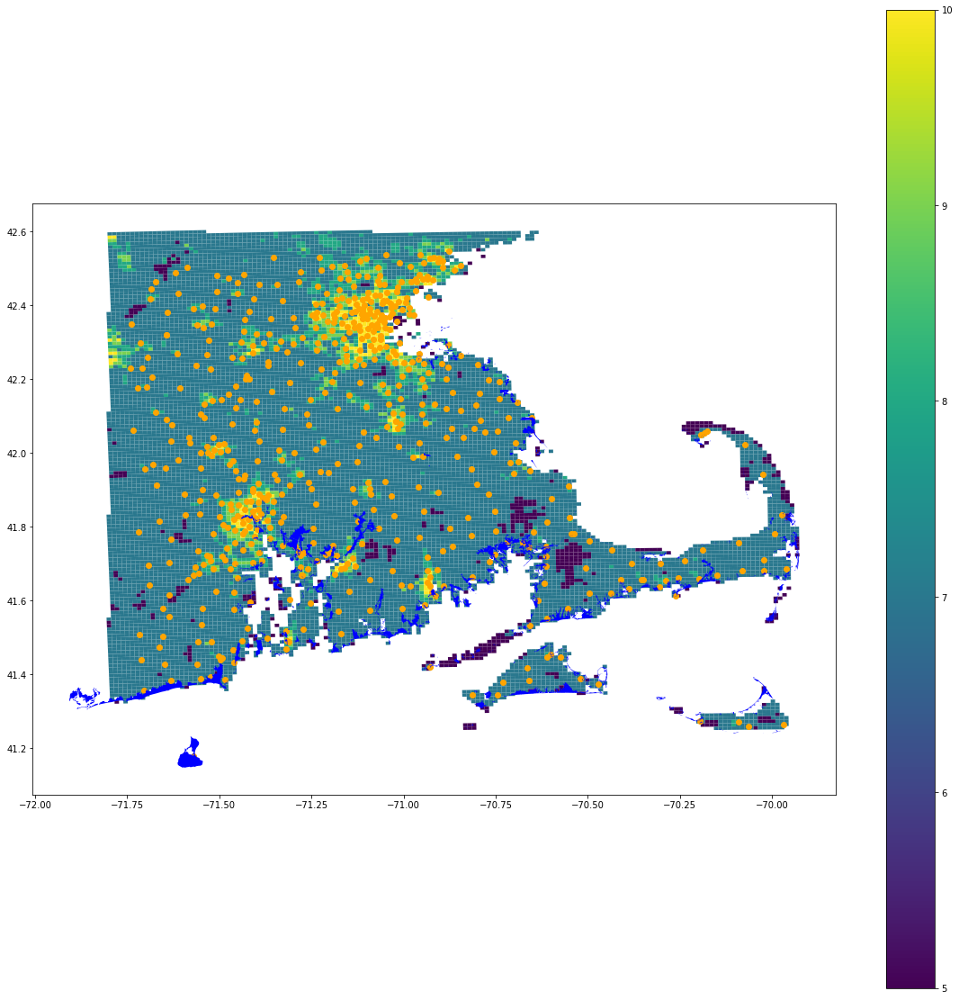

In [49]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
stations.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5)

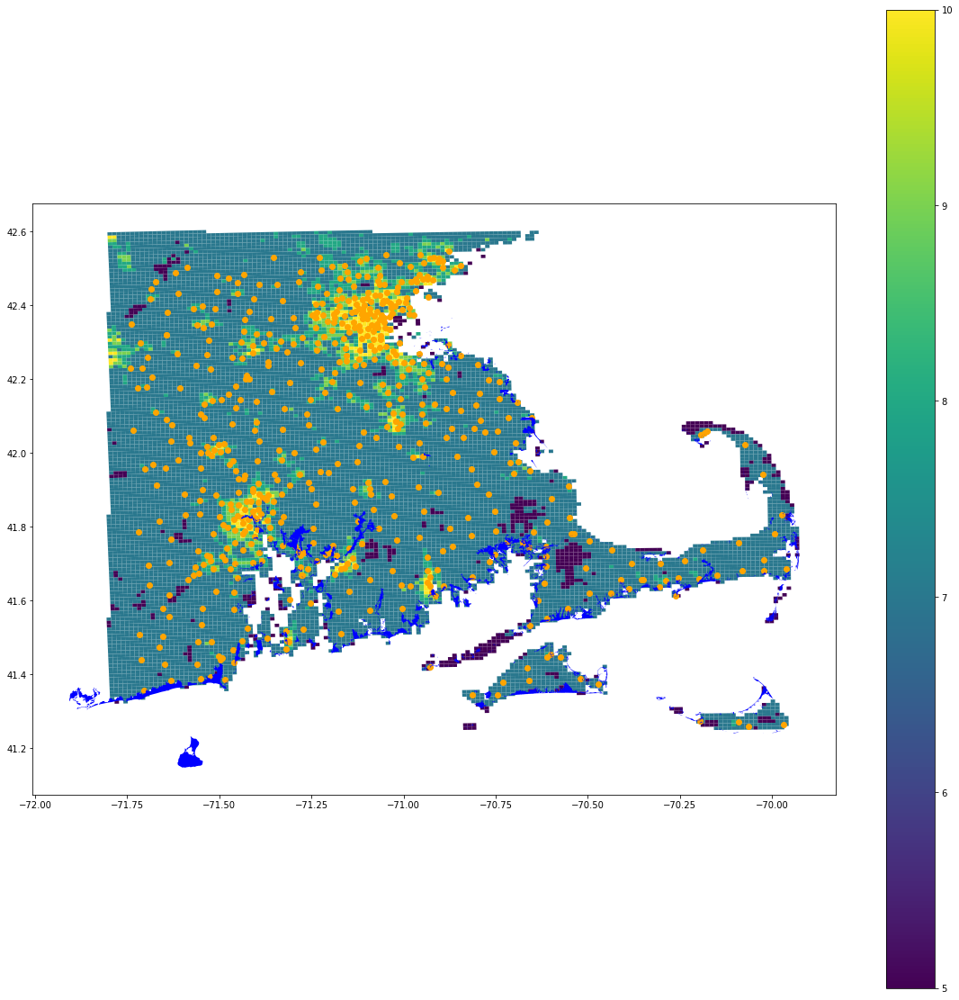

In [50]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_stations.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5)

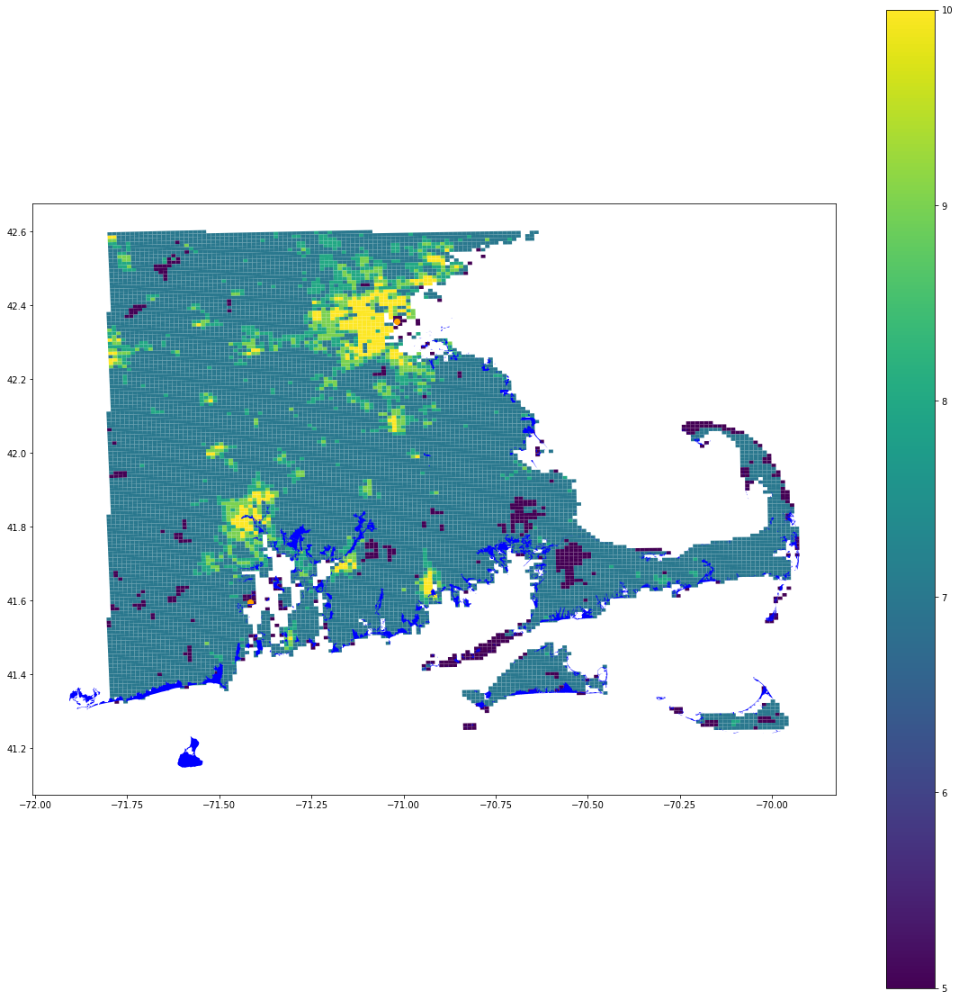

In [51]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
dead_stations.to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5)

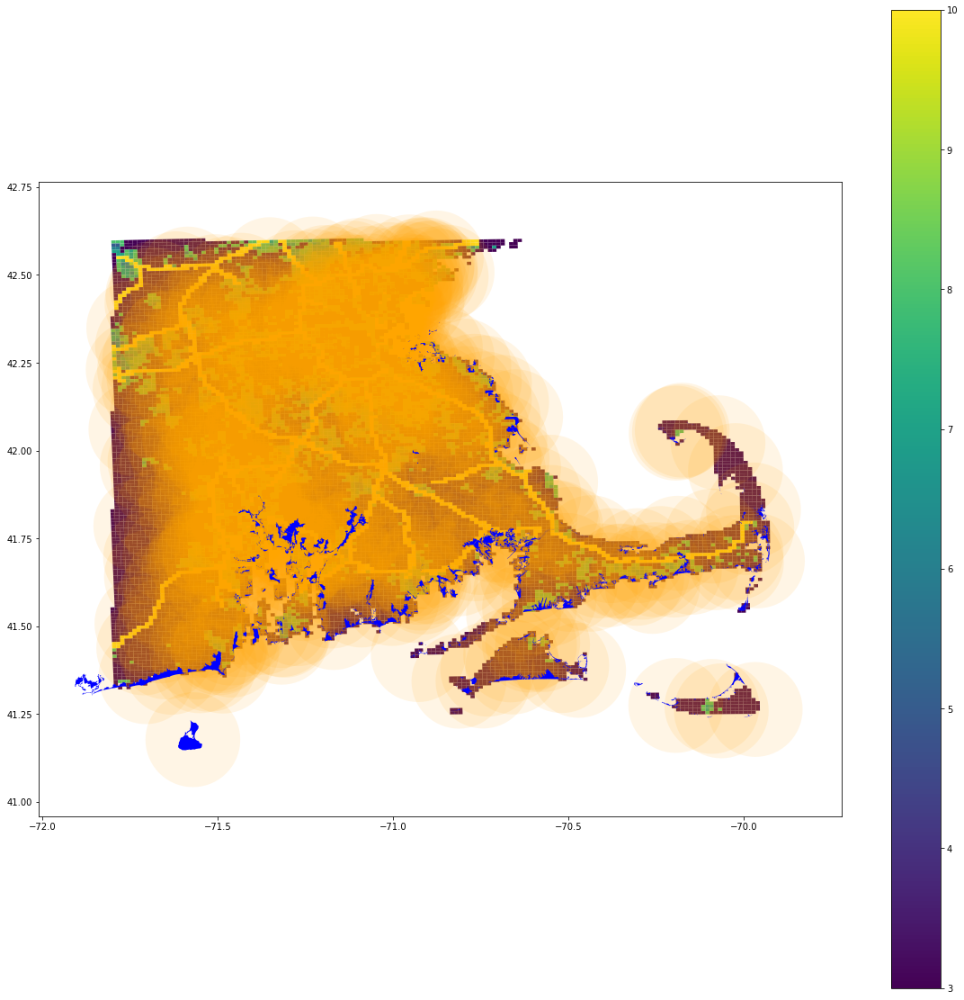

In [52]:
#transportation
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Transporta')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
stations.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5, alpha=0.1)

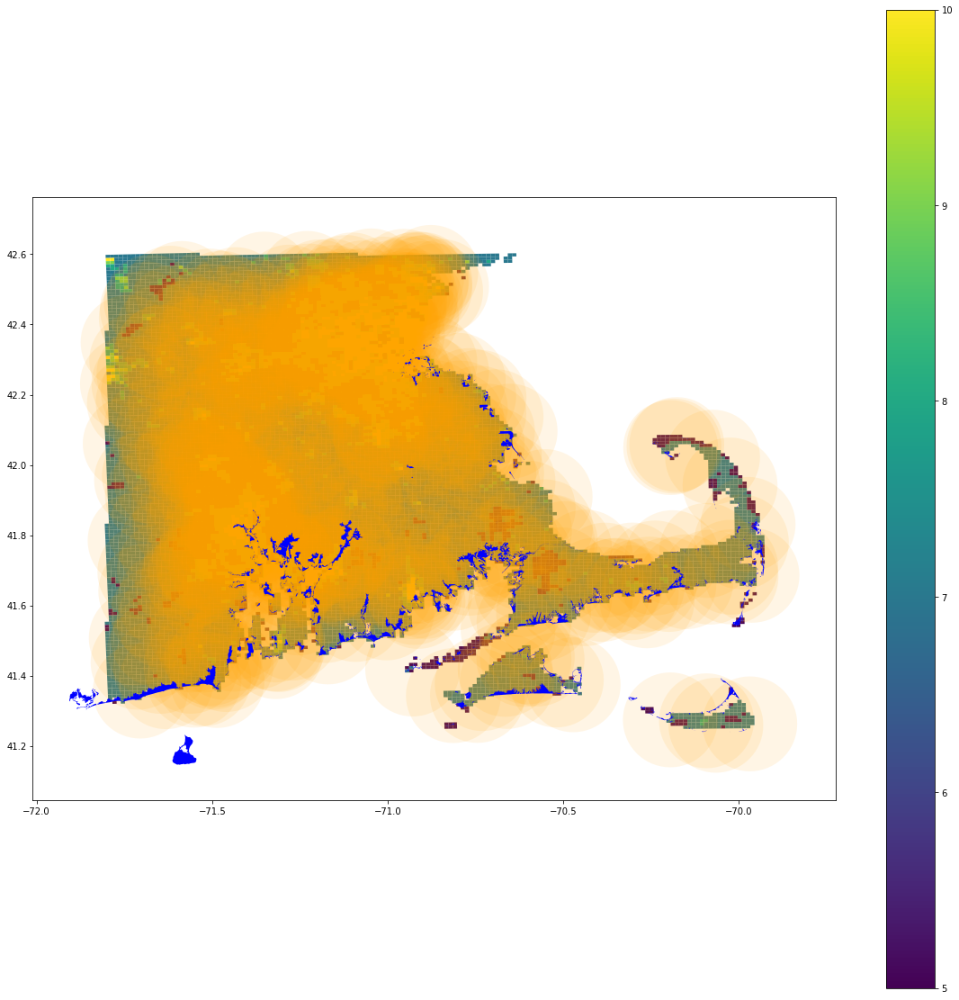

In [54]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_stations.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='orange', ax=ax, zorder=5, alpha=0.1)

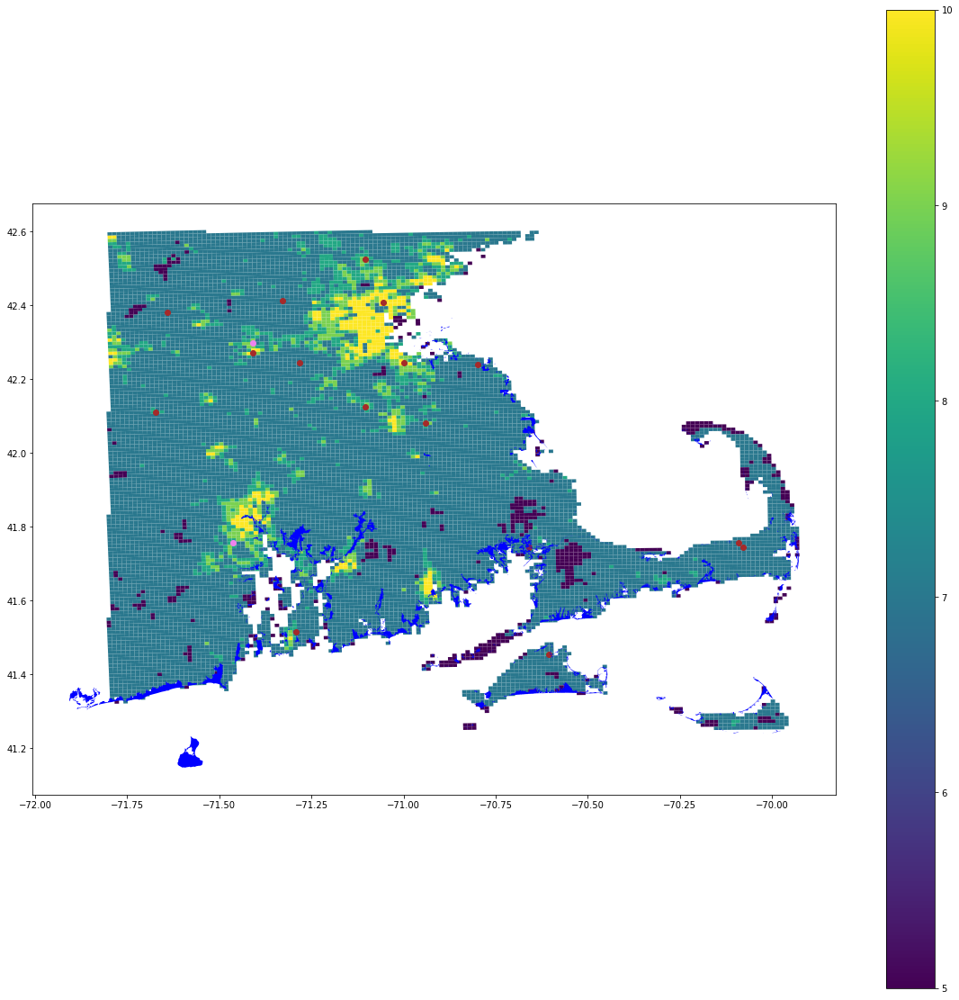

In [55]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
local_eo.to_crs(game_grid.crs).plot(color='brown', ax=ax, zorder=5)
state_eo.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)

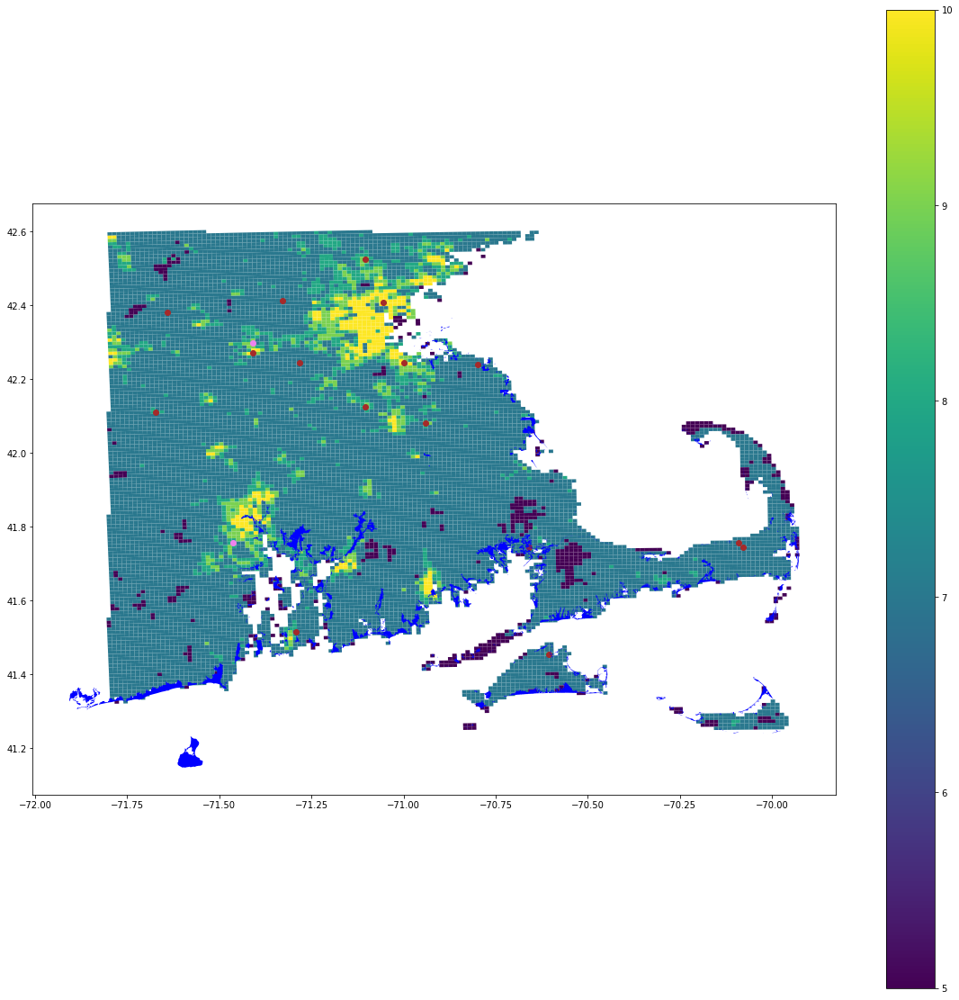

In [56]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_lcl_eo.to_crs(game_grid.crs).plot(color='brown', ax=ax, zorder=5)
eff_stt_eo.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)

/usr/local/lib/python3.6/dist-packages/geopandas/plotting.py:418: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  "empty. Nothing has been displayed.", UserWarning)


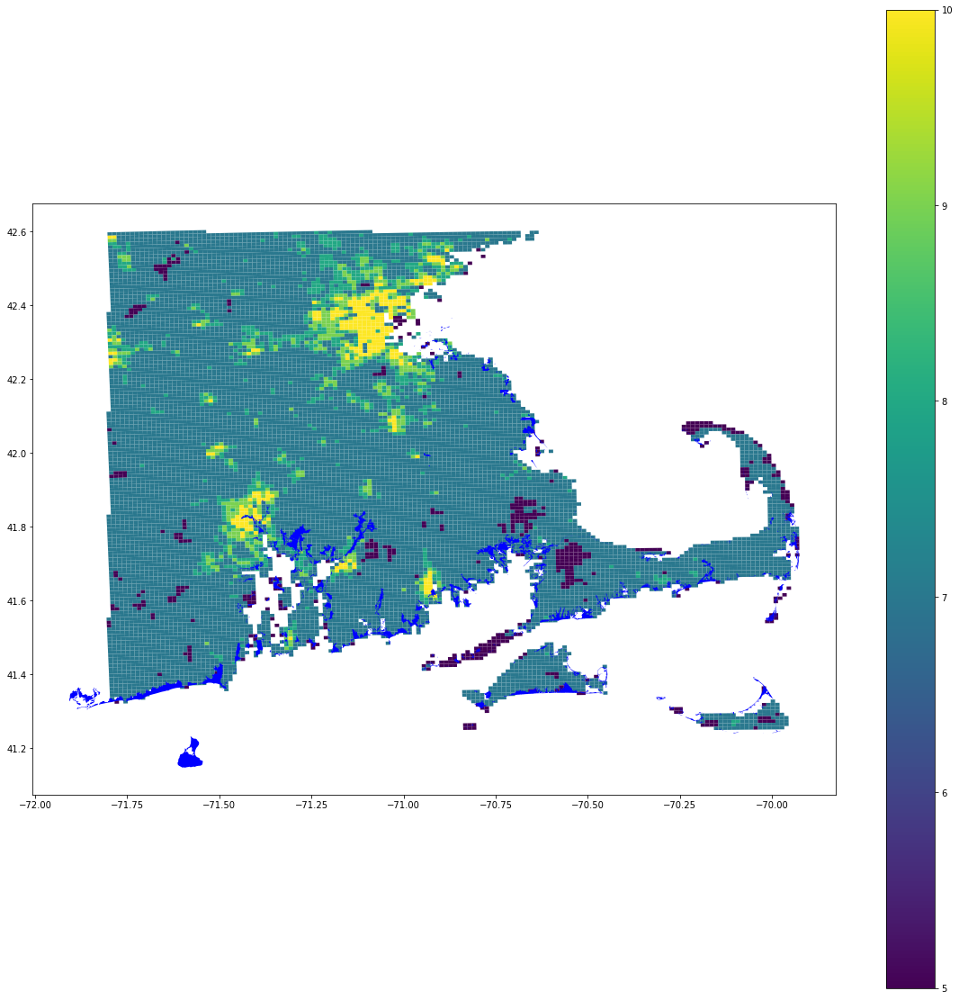

In [57]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
dead_lcl_eo.to_crs(game_grid.crs).plot(color='brown', ax=ax, zorder=5)
dead_stt_eo.to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5)

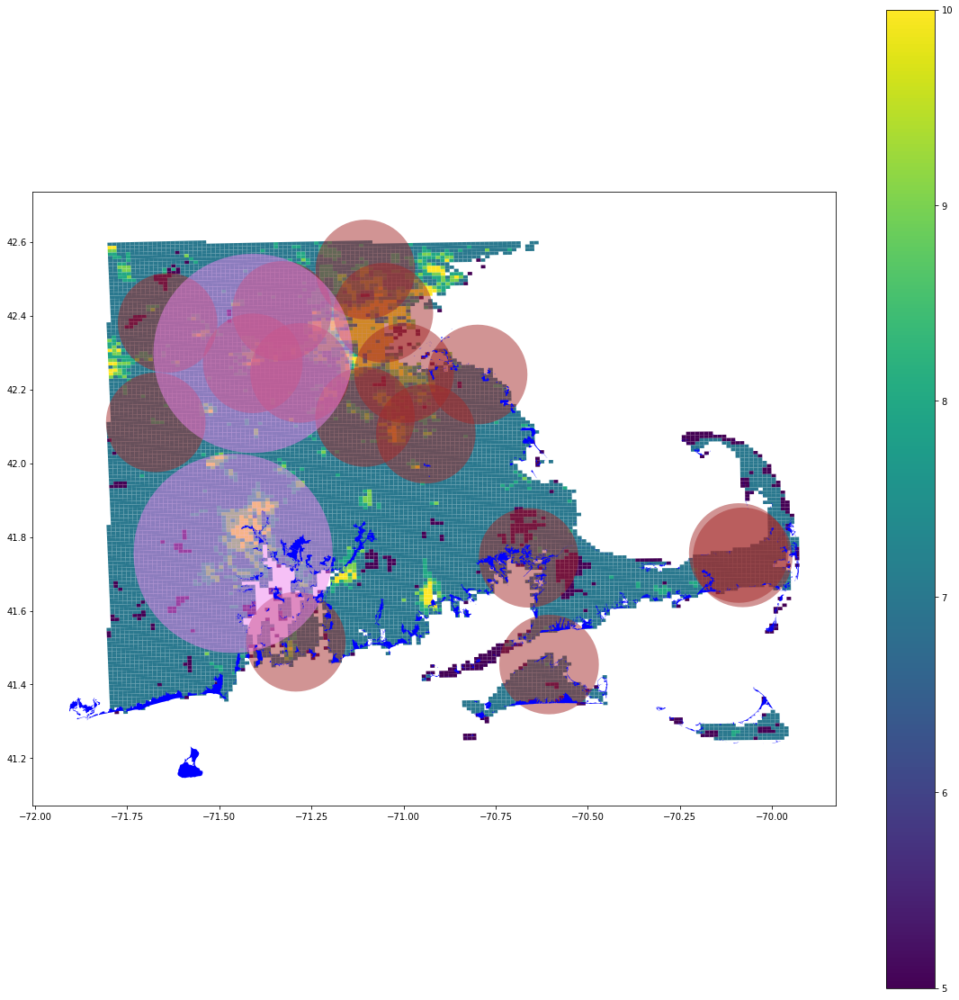

In [58]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
local_eo.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='brown', ax=ax, zorder=5, alpha=0.5)
state_eo.buffer(0.27027027027).to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5, alpha=0.5)

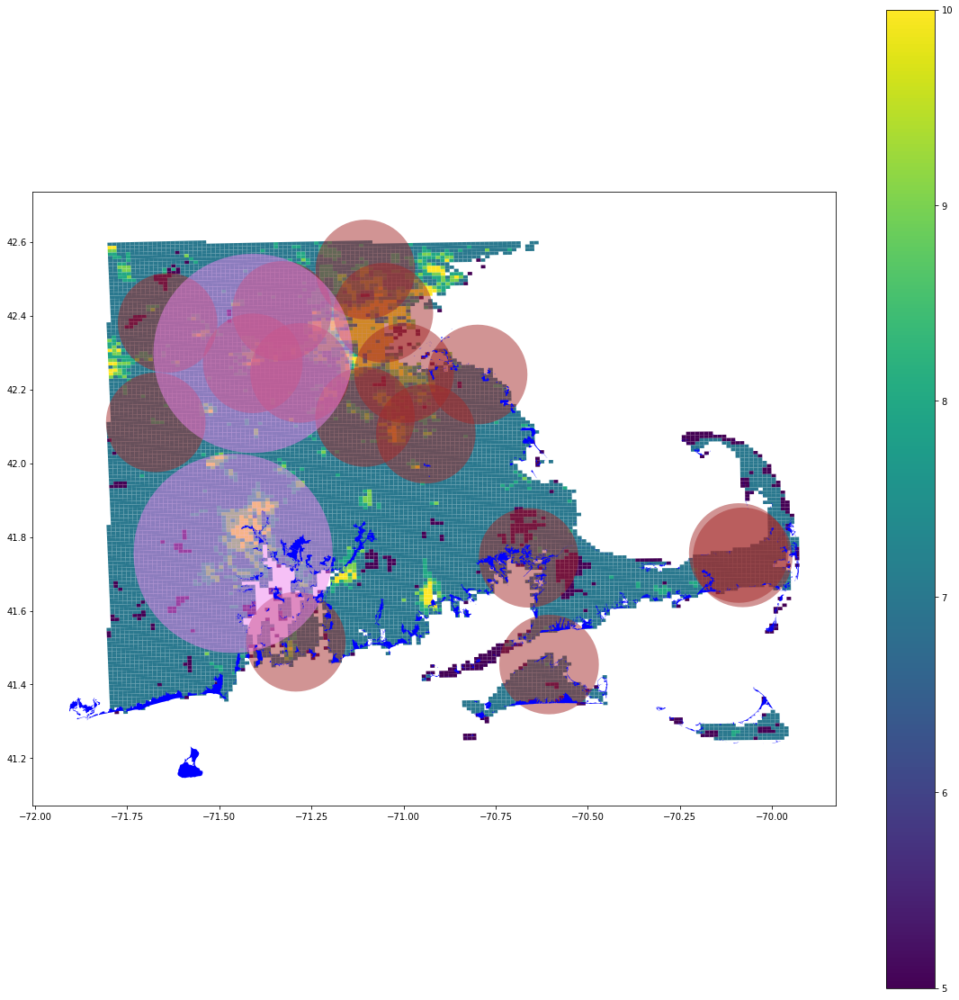

In [59]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Utility')
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax, zorder=10)
eff_lcl_eo.buffer(0.13513513513).to_crs(game_grid.crs).plot(color='brown', ax=ax, zorder=5, alpha=0.5)
eff_stt_eo.buffer(0.27027027027).to_crs(game_grid.crs).plot(color='violet', ax=ax, zorder=5, alpha=0.5)

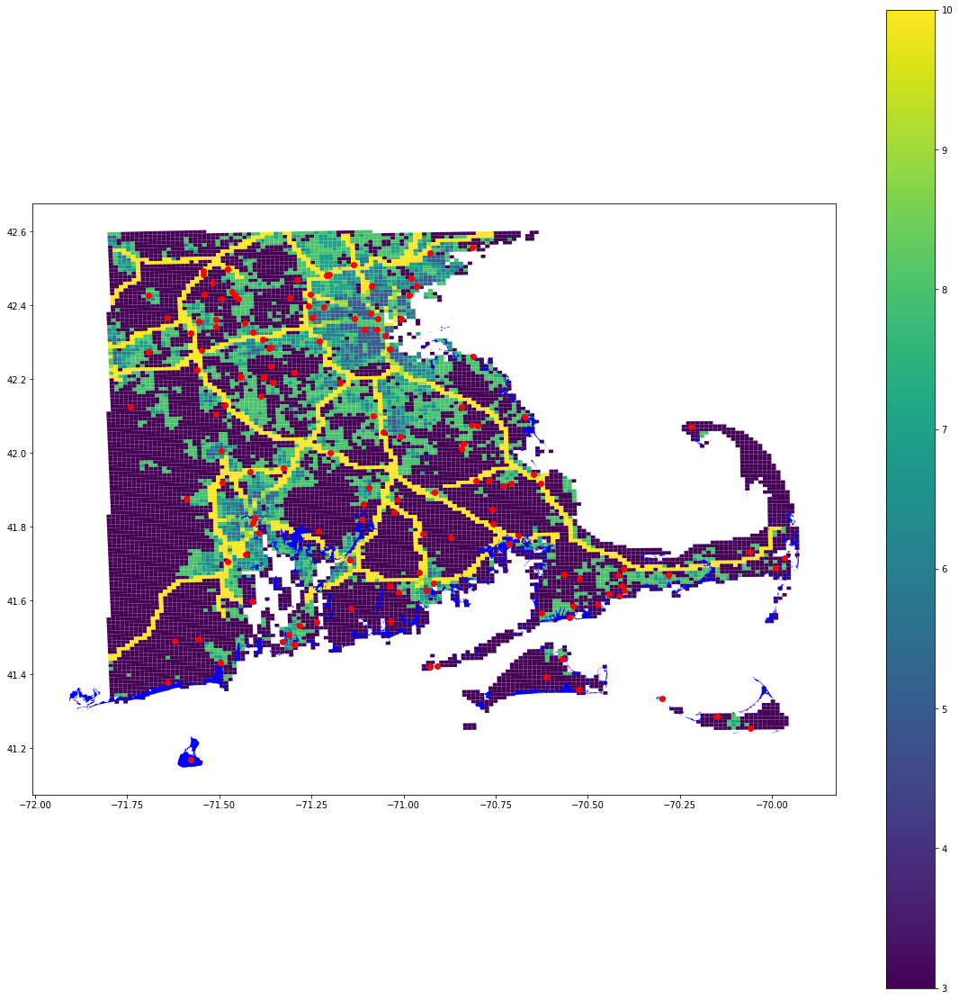

In [60]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Transporta', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)
airfields.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)

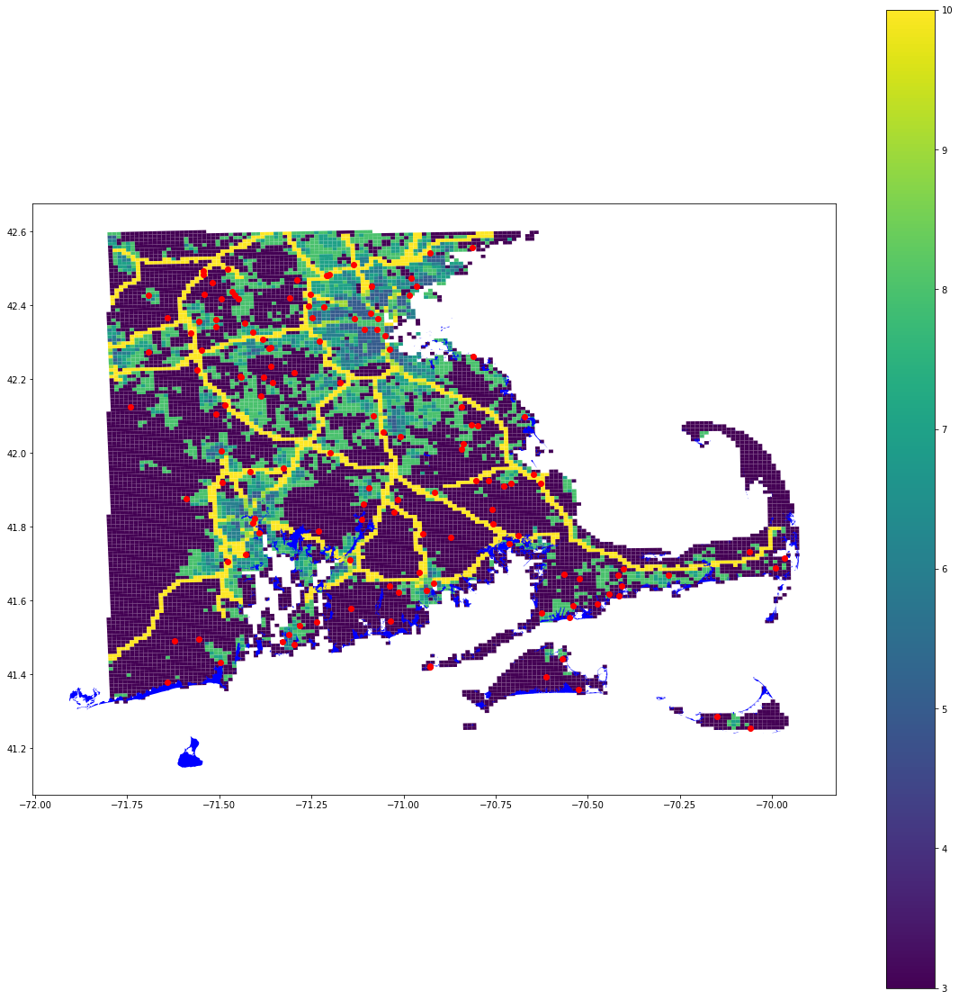

In [61]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Transporta', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)
eff_airfields.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)

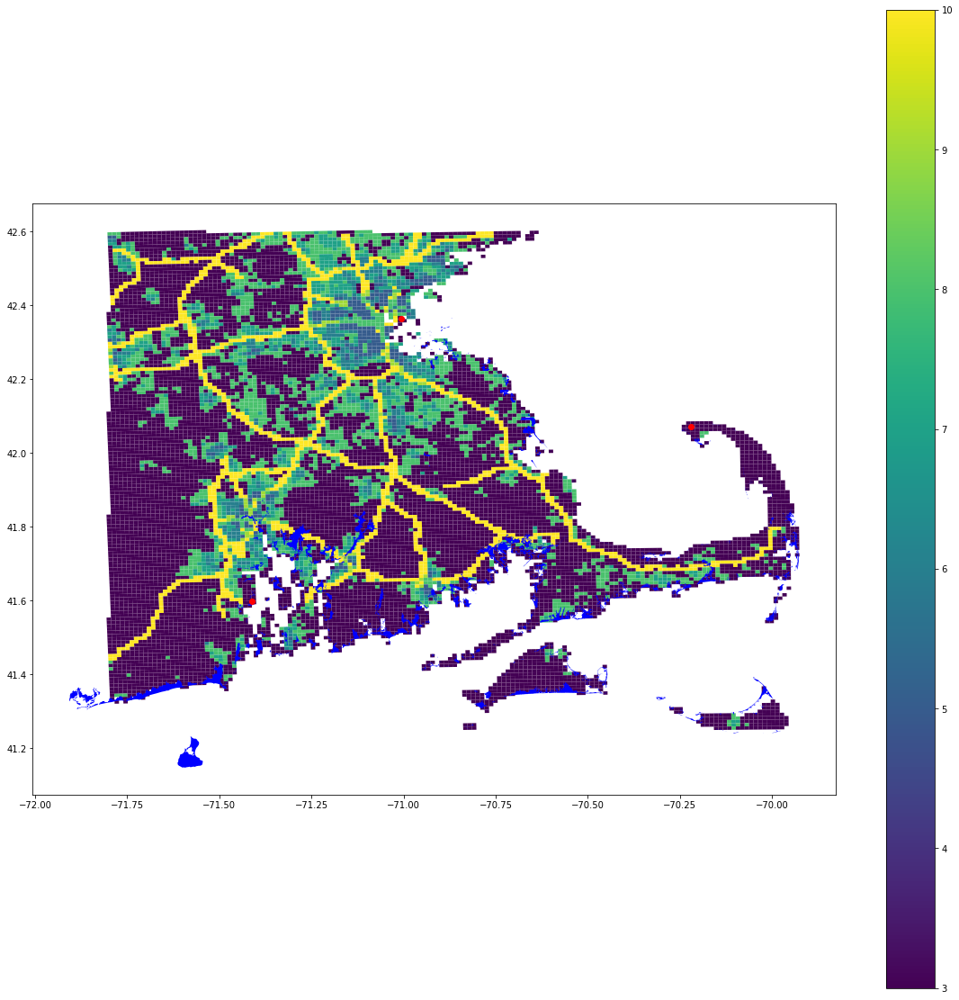

In [62]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
game_grid.plot(ax=ax, column='Transporta', legend=True)
flooding.to_crs(game_grid.crs).plot(color='blue', ax=ax)
dead_airfields.to_crs(game_grid.crs).plot(color='red', ax=ax, zorder=15)

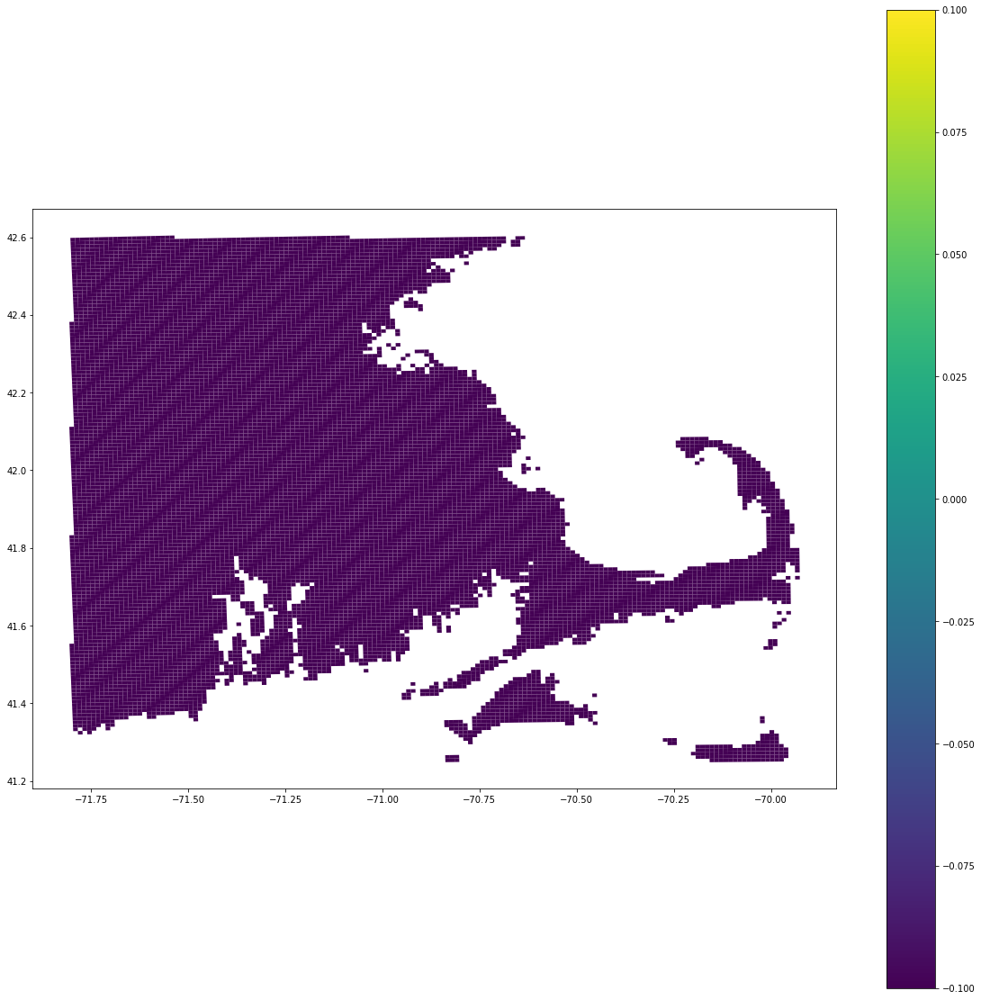

In [63]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
change.plot(ax=ax, column='Health', legend=True)

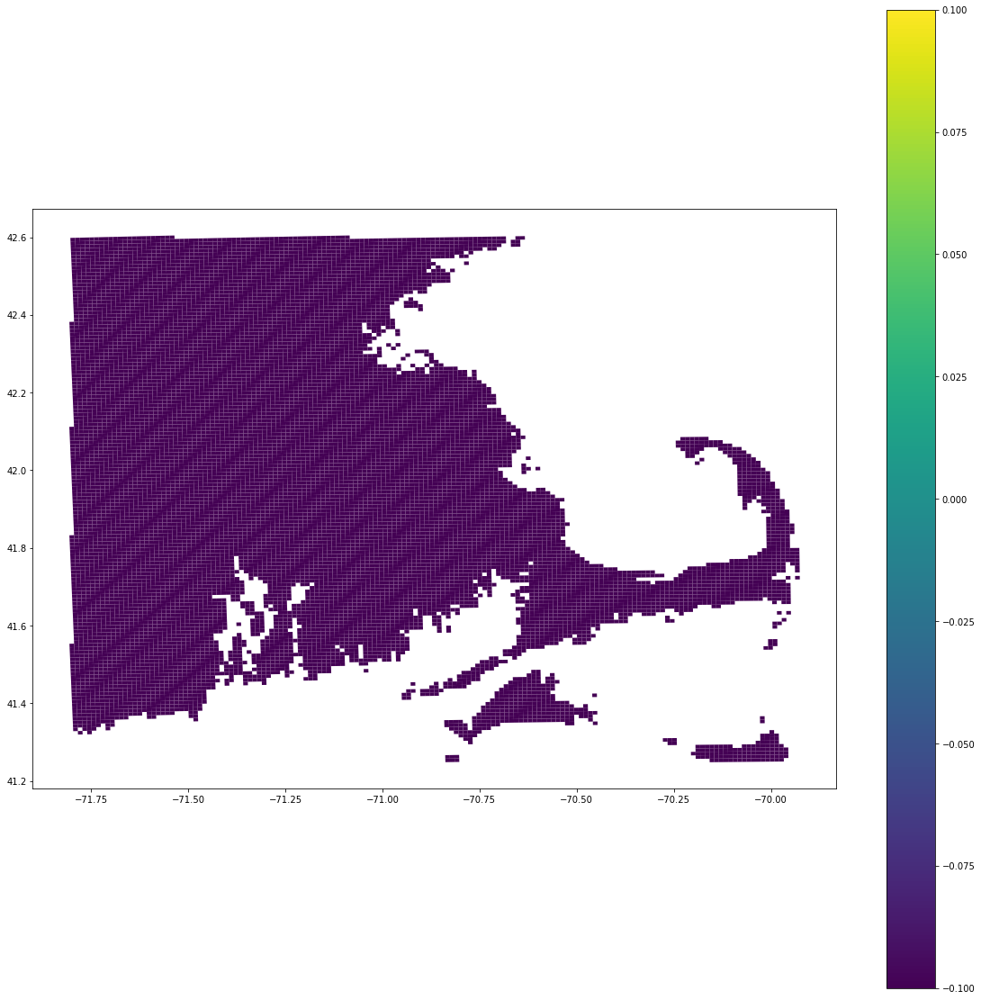

In [64]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
change.plot(ax=ax, column='Utility', legend=True)

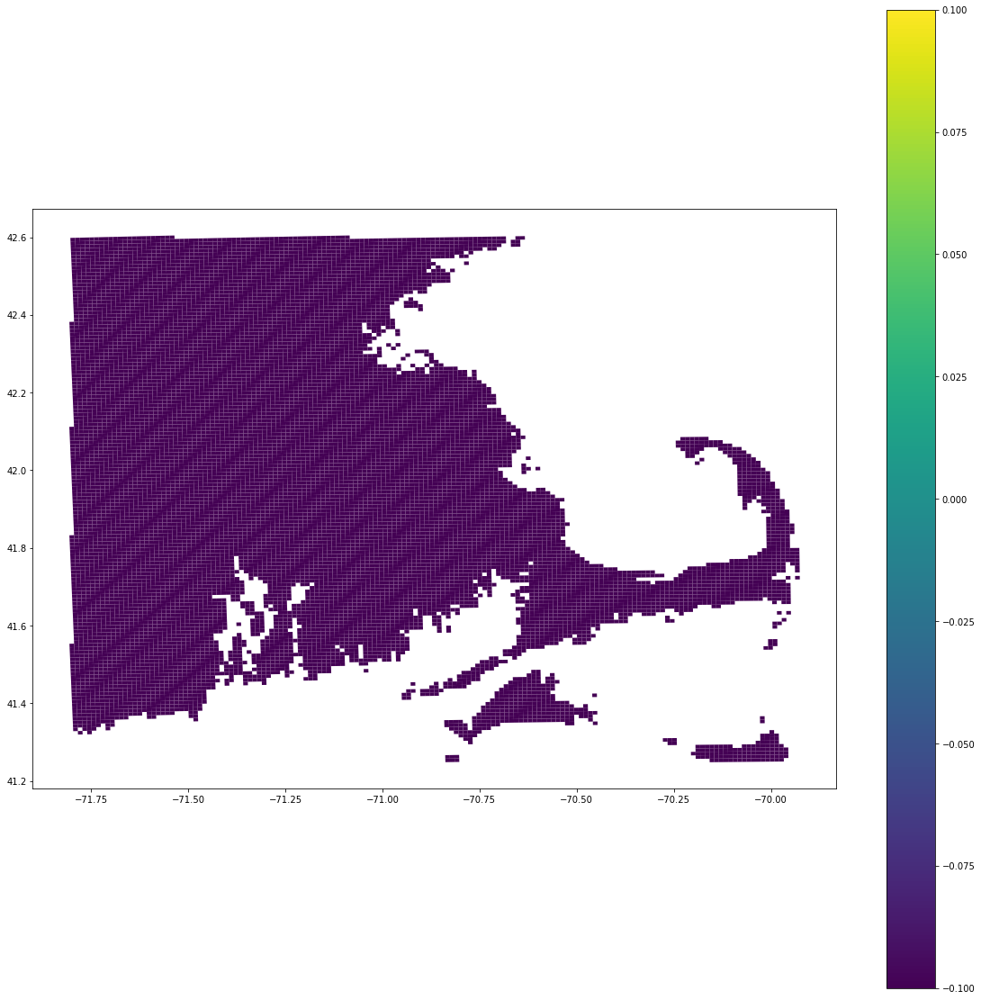

In [65]:
fig=plt.figure(figsize=[20,20])
ax=fig.add_subplot(1,1,1)
change.plot(ax=ax, column='Transporta', legend=True)

Health:

No one dies at 9-10

7-8 means each person has a .25% chance of dying per turn 

<7 means each person has a .5% chance of dying per turn

Utility:

Small Hospitals need >= 7

Big Hospitals need 9 or 10

Transportation:

10=100% movement speed,

9=90% movement speed

8=80% movement speed

and so on

We are almost gauranteed to have at least 3 days of prep time, and with average rolls, will have 4(3.5555555...)

With average rolls, we will have a catagory 2 hurricane.

Flooding and wind are proportional to the catagory of the hurricane.

Flooding drops all stats by an average of 3 and will not go further in a catagory 2 hurricane.

Wind drops the utility and transportation by 2(?) and drops health by 1, with 1 extra in highly-populated areas.

Wind is more likely to hit areas with greater utility or initial population